<div >
<img src = "figs/ans_banner_1920x200.png" />
</div>

# Caso-taller:  Recomendando el Blog de  Hernán Casciari 


[Hernán Casciari](https://hernancasciari.com/#bio), es un escritor argentino, que escribe blog posts con cuentos e historias  relacionadas con el futbol, su vida, infancia, y relaciones familiares con toques de ficción. Este [blog](https://hernancasciari.com/blog/) es  tan interesantes que en 2005 fue premiado como “El mejor blog del mundo” por Deutsche Welle de Alemania. 

El objetivo de este caso-taller es construir un sistema de recomendación basado en los contenidos de los posts.

## Instrucciones generales

1. Para desarrollar el *cuaderno*, primero debe descargarlo.

2. Para responder cada inciso deberá utilizar el espacio debidamente especificado.

3. La actividad será calificada sólo si sube el *cuaderno* de jupyter notebook con extensión `.ipynb` en la actividad designada como "entrega calificada por el personal".

4. El archivo entregado debe poder ser ejecutado localmente por el tutor. Sea cuidadoso con la especificación de la ubicación de los archivos de soporte, guarde la carpeta de datos en el mismo `path` de su cuaderno, por ejemplo: `data`.

## Desarrollo


### 1.Carga de datos 

En los `Archivos de Laboratorio` en la carpeta `data` se encuentran el archivo posts con el título, la fecha de publicación, y el contenido de posts de sr. Casciari. Cargue estos datos en su *cuaderno*
   

(181, 3)


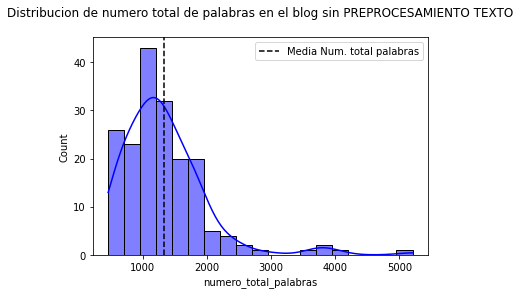

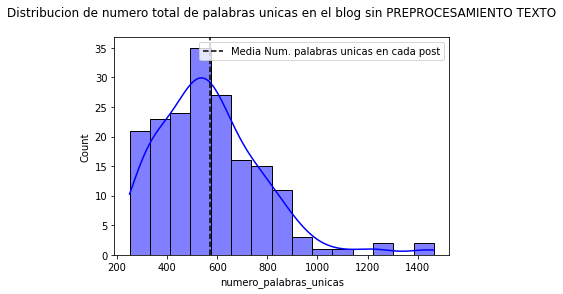

                        count         mean         std    min    25%     50%  \
numero_palabras_unicas  181.0   572.458564  210.263736  250.0  431.0   557.0   
numero_total_palabras   181.0  1332.292818  672.021906  461.0  886.0  1202.0   

                           75%     max  
numero_palabras_unicas   672.0  1465.0  
numero_total_palabras   1601.0  5206.0  


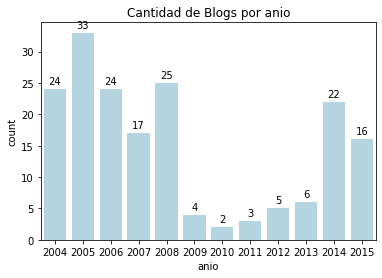

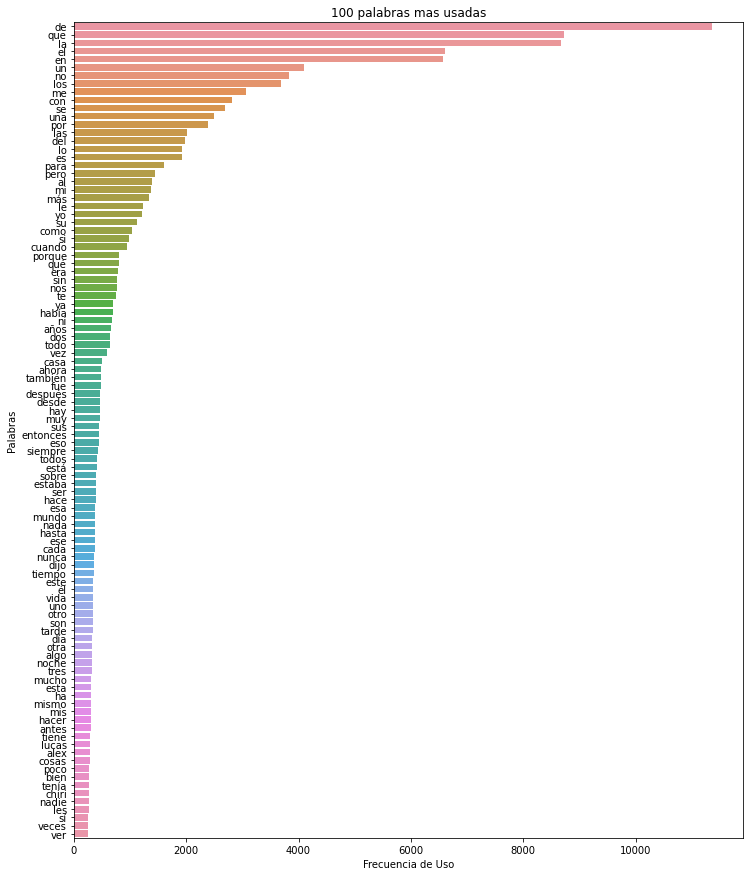

Numero de palabras en todo el corpus 23070



In [ ]:
# Cargamos las librerías a utilizar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


# Obtener el anio desde el campo fecha
def extraer_anio_post(texto): 
    anio= int(re.findall(r'\d{4}',texto)[0])
    return anio


# Frecuencia de uso de plabras que conforman el corpus(todas las entradas)
def frecuencia_uso_palabras(corpus): 
    vectorizer = CountVectorizer(analyzer='word')
    plot_dtm = vectorizer.fit_transform(corpus)
    plots_df = pd.DataFrame(plot_dtm.toarray(), columns=vectorizer.get_feature_names_out())
    freq_plots= plots_df.sum().sort_values( ascending=False)[0:100]
    plt.figure(figsize=(12,15)) 
    ax=sns.barplot(x=freq_plots.values, y=freq_plots.index)
    ax.set(title='100 palabras mas usadas', xlabel='Frecuencia de Uso', ylabel='Palabras')
    plt.show()
    print(f'Numero de palabras en todo el corpus {len(vectorizer.get_feature_names_out())}\n')
    
# Obtiene la longitud del vocabulario unico en cvada entrada
def vocabulario(cuento):
    corpus=[]
    vectorizer = CountVectorizer(analyzer='word')
    corpus.append(cuento)
    plot_dtm = vectorizer.fit_transform(corpus)
    return len(vectorizer.get_feature_names_out())

#Obtiene el numero de palabras total en cada entrada
def numero_palabras_post(cuento):
    corpus=[]
    vectorizer = CountVectorizer(analyzer='word')
    corpus.append(cuento)
    plot_dtm = vectorizer.fit_transform(corpus)
    return np.sum(plot_dtm)


# 1.Histogramas  de numero total de palabras  en cada post y # 2. Histogramas de numero de palabras  unicas
def histogramas_numero_palabras(df, columna='cuento', label='sin'):
  df['numero_palabras_unicas'] = df[columna].apply(vocabulario)              #Obtner el numero de palabras unicas por entrada
  df['numero_total_palabras'] =  df[columna].apply(numero_palabras_post)     #Obtner el numero de palabras unicas por entrada

  #Distribucion de numero total de palabras  en cada post
  sns.histplot(df['numero_total_palabras'],  kde=True, color='b')
  plt.axvline(df['numero_total_palabras'].mean(), color='k', linestyle='--', label='Media Num. total palabras')
  plt.title('Distribucion de numero total de palabras en el blog ' + label +' PREPROCESAMIENTO TEXTO\n '); 
  plt.legend()
  plt.show()
  #Distribucion de numero de palabras  unicas
  sns.histplot(df['numero_palabras_unicas'],   kde=True, color='b')
  plt.axvline(df['numero_palabras_unicas'].mean(), color='k', linestyle='--', label='Media Num. palabras unicas en cada post')
  plt.title('Distribucion de numero total de palabras unicas en el blog ' + label +' PREPROCESAMIENTO TEXTO\n '); 
  plt.legend()
  plt.show()  

  print(df[['numero_palabras_unicas','numero_total_palabras']].describe().T)


## MAIN 

blog = pd.read_csv('data/posts.csv', sep=',')                              # Cargamos los datos 
print(blog.shape)
blog['anio'] = blog['fecha'].apply(lambda texto: extraer_anio_post(texto)) #Creaemos una columna con el anio
blog.head()

df= blog.copy()                                                             # Copia profunda para no alterar blog
histogramas_numero_palabras(df)                                             # Histogramas

#Cantidad de Blogs por anio
plot=sns.countplot(data = blog, x = 'anio',color = 'lightblue' )
for bar in plot.patches:
    plot.annotate( bar.get_height(),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),  textcoords='offset points')
plt.title('Cantidad de Blogs por anio'); 
plt.show()

#100 palabras mas usadas en todo el corpus
frecuencia_uso_palabras(blog['cuento'])


# Procedimiento:

- Cargar post.csv a un dataframe llamado blog.
- Se extrae de la columna fecha, el año usando una expresion regular.
- Se hace una exploracion inicial de datos con el texto  del post en forma cruda. Para lograr esto, se usa CountVectorizer para obtener por cada entrada, la longitud del vocabulario y la longitud de las palabras totales. Se obtiene que en promedio la longitud del vocabulario unico son 572 palabras con una desviacion standar de 210, y en promedio la cantidad total de palabras de cada entrada es 1332 con una desviacion standar de 672.

- El año con mas entradas fue 2005 con un total de 33 entradas.

- Se obtiene una visualizacion de las palabras mas frecuentes y se puede ver que son preposiciones, articulos definidos en indefinidos y conectores cuya longitud es menor a 3 caracteres.

- Todo el corpus esta conformado por un vocabulario de 23070 palabras unicas.

### 2. Análisis exploratorio de los datos. 

En esta sección exploraremos los posts.

#### 2.1 Limpie y homogenice  el texto de los posts, sin eliminar las *stopwords* ni lematizar. Explique paso  a paso su procedimiento ilustrando con una de las entradas del blog. Sea explicito si remueve alguna palabra en especial.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 235 kB 12.6 MB/s 


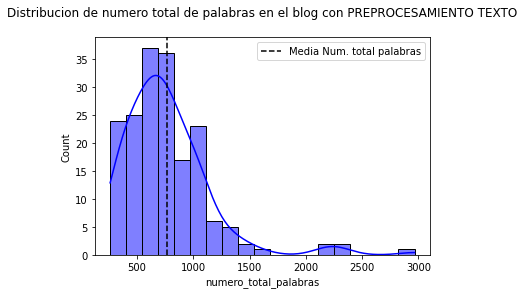

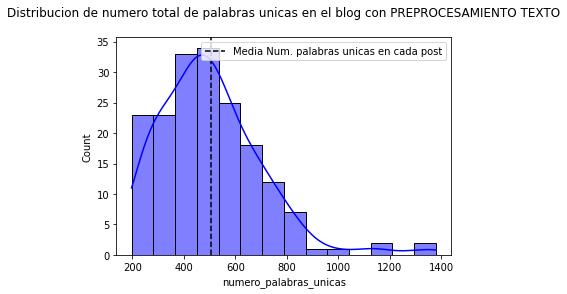

                        count        mean         std    min    25%    50%  \
numero_palabras_unicas  181.0  504.066298  200.030542  197.0  364.0  490.0   
numero_total_palabras   181.0  764.104972  390.206989  261.0  515.0  700.0   

                          75%     max  
numero_palabras_unicas  604.0  1379.0  
numero_total_palabras   934.0  2965.0  


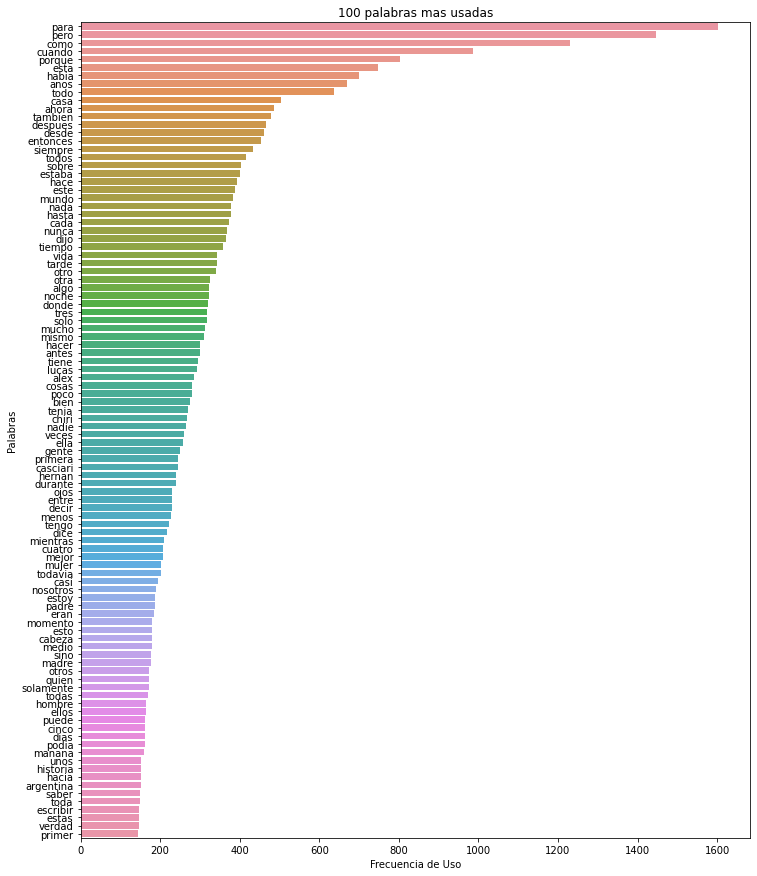

Numero de palabras en todo el corpus 22036

Las noticias más importantes nunca aparecen en la tapa del diario sino en las páginas del fondo, y casi siempre tienen que ver con la ciencia, la biotecnología, la astronomía y los chusmerío de la farándula (en español: los cotilleos del famoseo). Sacando esto último, que solamente tiene una trascendencia que alimenta la frivolidad necesaria para equilibrar mi profundo compromiso con la problemática del universo, a mí las noticias que más me gustan son los descubrimientos raros.

Cuando aparecen estas informaciones, enseguida las recorto y las pongo en el segundo cajón, que es el cajón donde tengo las pruebas académicas que confirman que tengo razón en casi todo lo que discuto. Por ejemplo el descubrimiento de que el universo es explicable, y que las teorías de la relatividad son compatibles con la física cuántica. Tomá mate.

Todo eso ahora se llama Teoría M, que viene de Magia y de Misterio, y también viene de Maldacena (Juan Martín), que e

In [ ]:
!pip install Unidecode
from unidecode import unidecode

#Remover caraters especiales 
def remover_caracteres_especiales(texto): 
    text_prep = re.sub(r'[^\w\s]|\n', r' ', texto)
    text_prep = text_prep.strip()
    return text_prep

#Remover palabras/tokens cuya no longitud sea mayor > min_longitud
def remover_palabras_longitud_menor(texto, min_longitud):
    text_prep=""
    for palabra in texto.split():
        if len(palabra) >= min_longitud:
            text_prep += palabra
        text_prep += " "
    text_prep = text_prep.strip()
    return text_prep

#Remover Extra Espacios en blanco    
def remove_extra_espacios(texto):
    text_prep = re.sub(' +', ' ', texto)
    return text_prep



## MAIN -SUPRESION DE RUIDO

#Validar si hay alguna entrada vacia con spacios completamente, para ser eliminada 
blog=blog[~(blog['cuento'].str.len()==0)]
blog=blog[~blog['cuento'].str.isspace()]
    

#Creamos una nueva columna en blg llamada text_procesado para alamcenar el texto sin ruido
blog["texto_preprocesado"] = blog['cuento'].str.lower()  
blog["texto_preprocesado"] = blog["texto_preprocesado"].apply(lambda texto: unidecode(texto))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remover_caracteres_especiales(texto))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remover_palabras_longitud_menor(texto,4))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remove_extra_espacios(texto))

df= blog.copy()
histogramas_numero_palabras(df, 'texto_preprocesado', 'con')                                             # Histogramas
#100 palabras mas usadas en todo el corpus despues de la supresion de ruido
frecuencia_uso_palabras(blog["texto_preprocesado"])

print(blog.loc[3]["cuento"])
print(blog.loc[3]["texto_preprocesado"])


# Análisis

- Se hace preprocesamiento del texto de cada entrada para eliminar ruido y homogenizar el texto. 
- La homogenizacion del texto se hace a traves de convertir todos los caracteres a minusculas y quitar acentos y tildes.
- La supresion de ruido se hace a traves de la supresion de carácteres especiales, supresion de signos de puntuacion,  la supresion de palabras de longitud menor  e igual a 3 caracteres, la supresion de extra espacios en blanco.

- Se crea una nueva columna `texto_preprocesado` que almacena el texto preprocesado por cada entrada.


- En el diagrama de palabras mas frecuentes, se puede observar que nos deshicimos de las preposiciones , conjunciones, y algunos articulos  cuya longitud era menor igual a 3. 

- En los histogramas , se observa que en promedio despues de homogenizado el texto y suprimido el ruido, en promedio cada entrada tiene 504 palabras unicas con desviacion standart de 200 y cada entrada tiene en promedio 764 palabras con desviacion standart de 390

- Se escoge la entrada "Mis conflictos con la ciencia.". Como se puede observar, el texto preprocesado no tiene saltos de linea, no tiene tildes, todo esta minusculas, y las puntuaciones se removieron.

-  Todo el corpus  del nuevo texto preprocesado esta conformado por un vocabulario de 22036 palabras unicas.

#### 2.2 ¿Cuáles son las palabras más utilizadas por año? Presente sus resultados usando una nube de palabras por año.

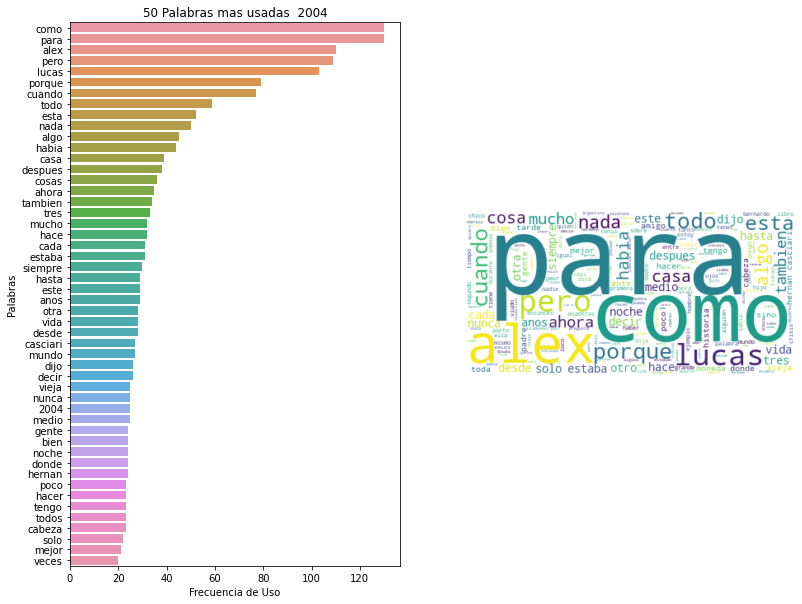

Numero de palabras 2004:4154


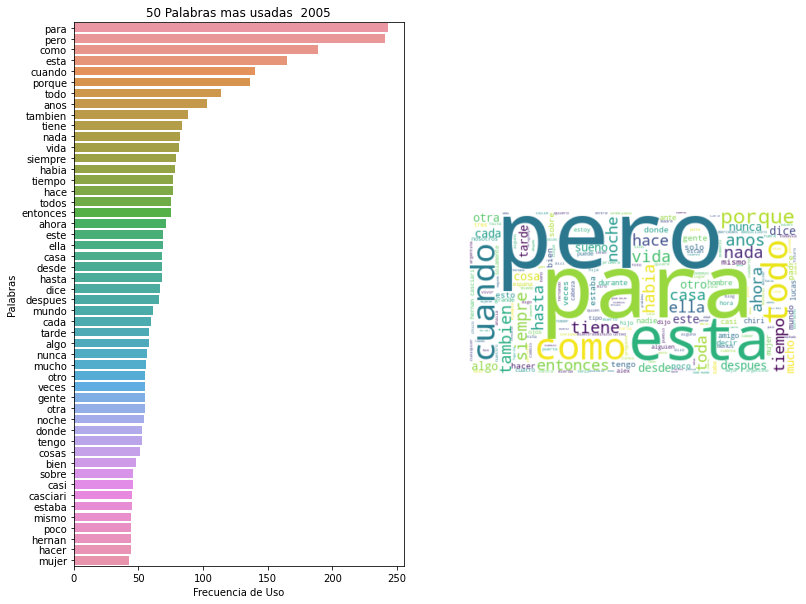

Numero de palabras 2005:6875


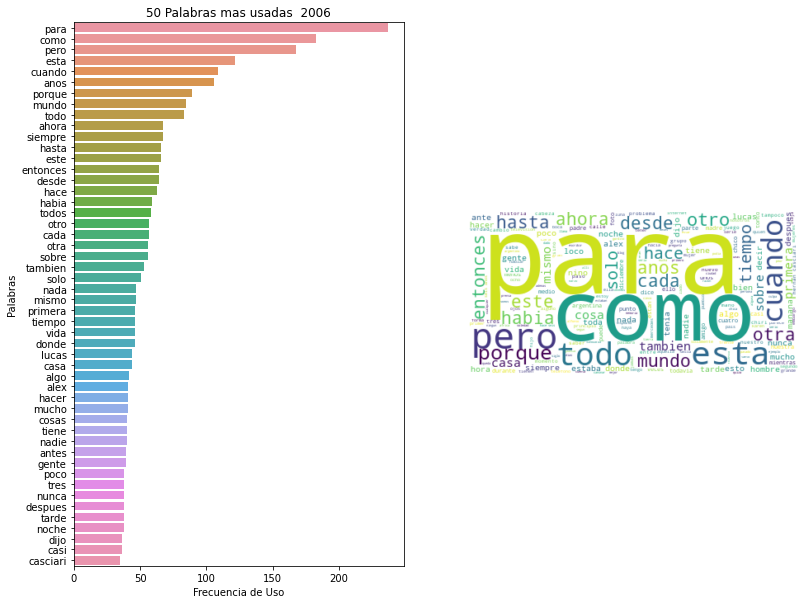

Numero de palabras 2006:6954


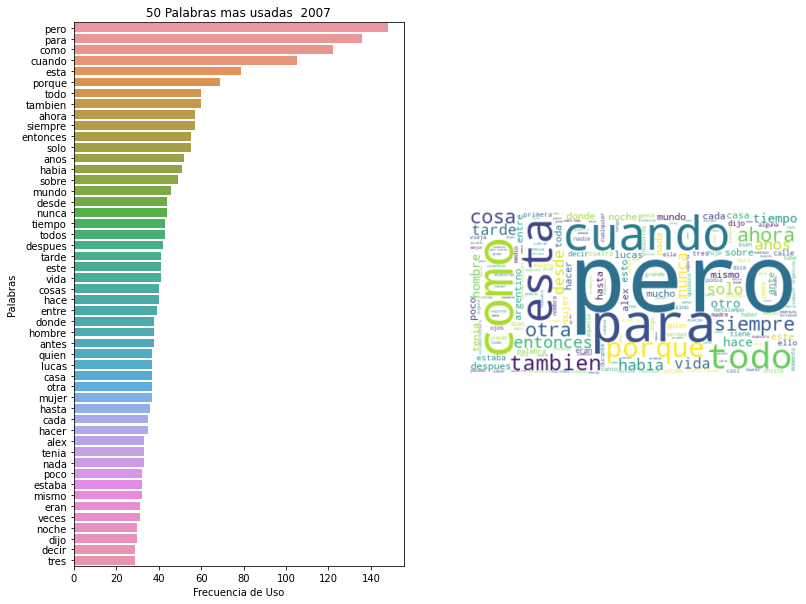

Numero de palabras 2007:5672


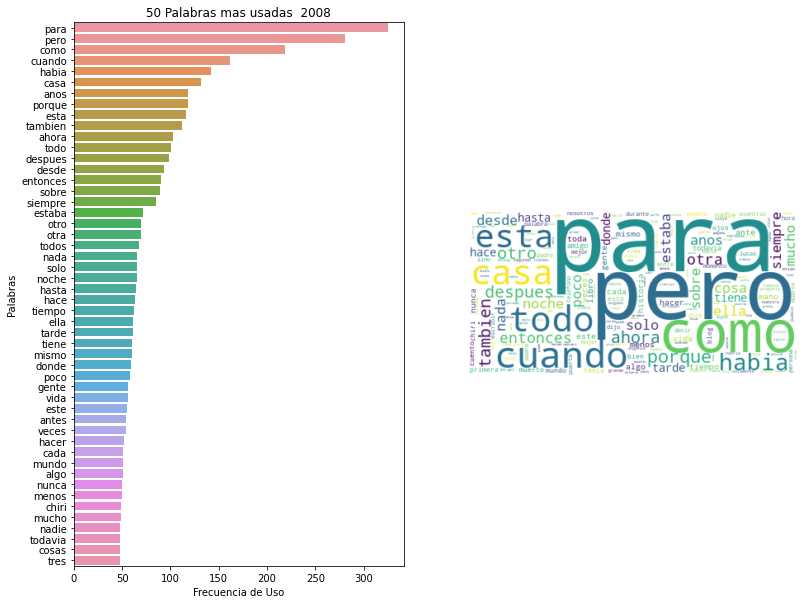

Numero de palabras 2008:7596


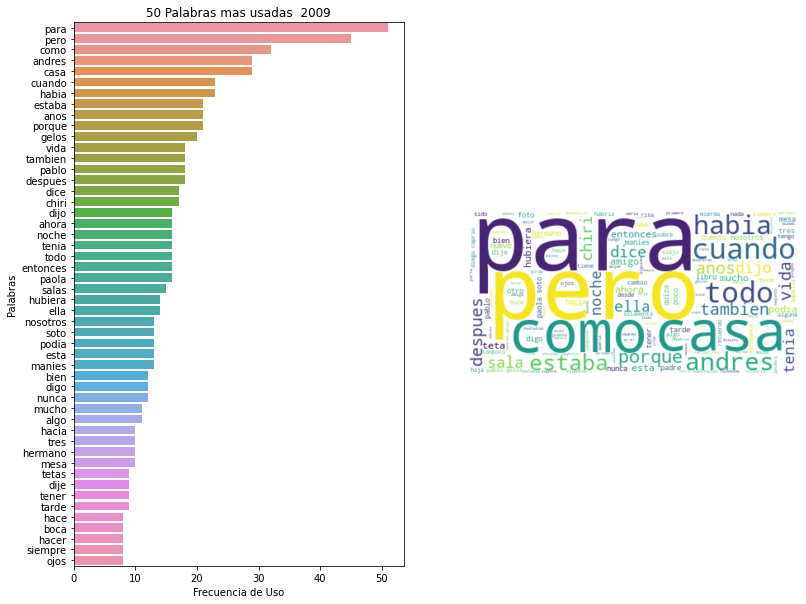

Numero de palabras 2009:1701


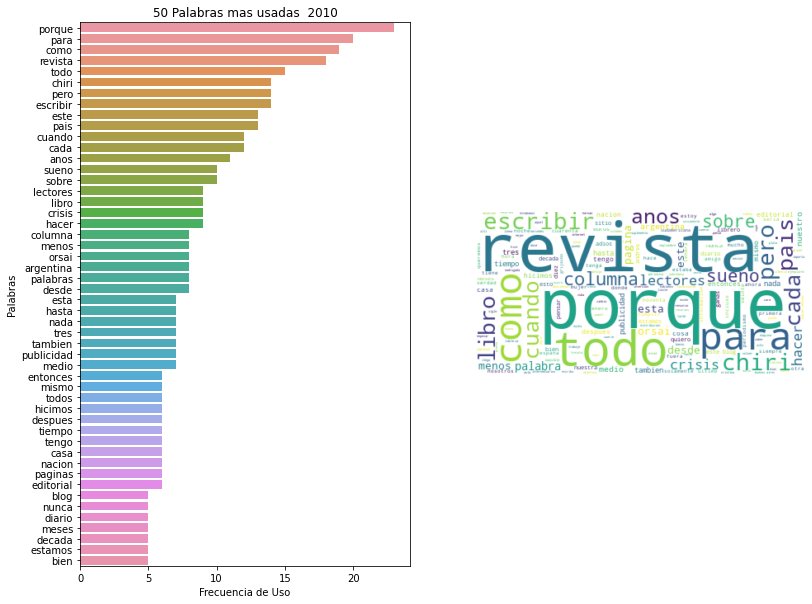

Numero de palabras 2010:1182


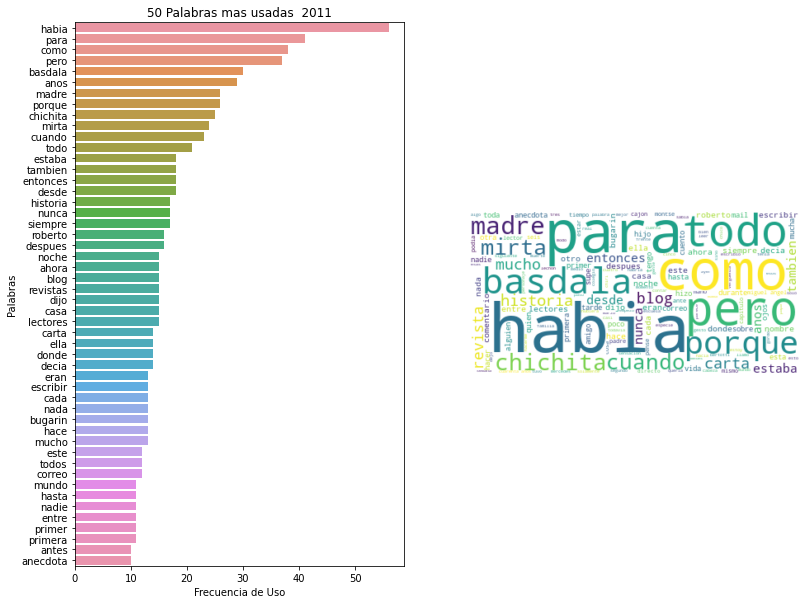

Numero de palabras 2011:1957


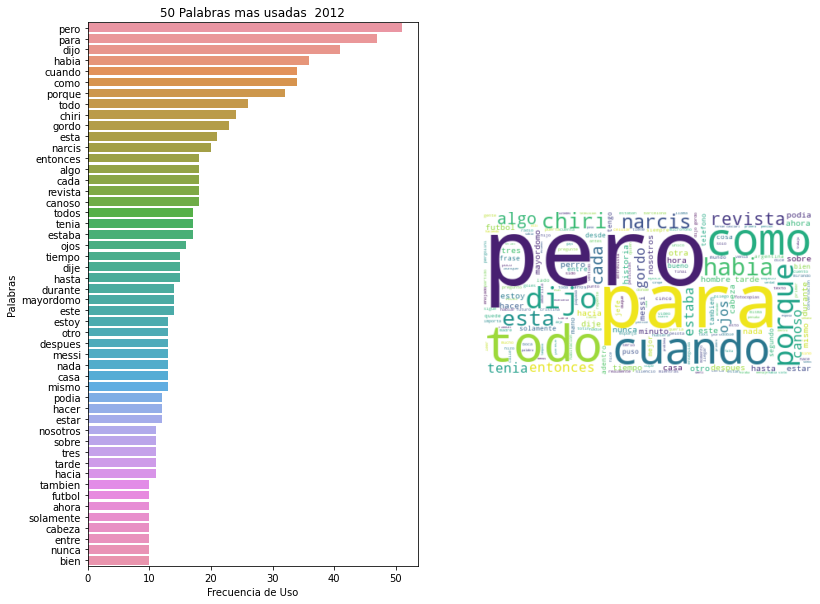

Numero de palabras 2012:2126


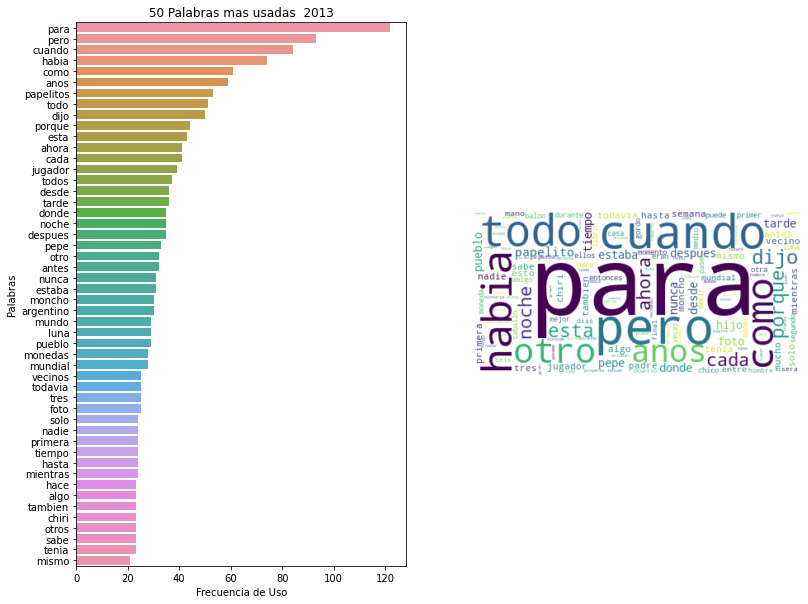

Numero de palabras 2013:3710


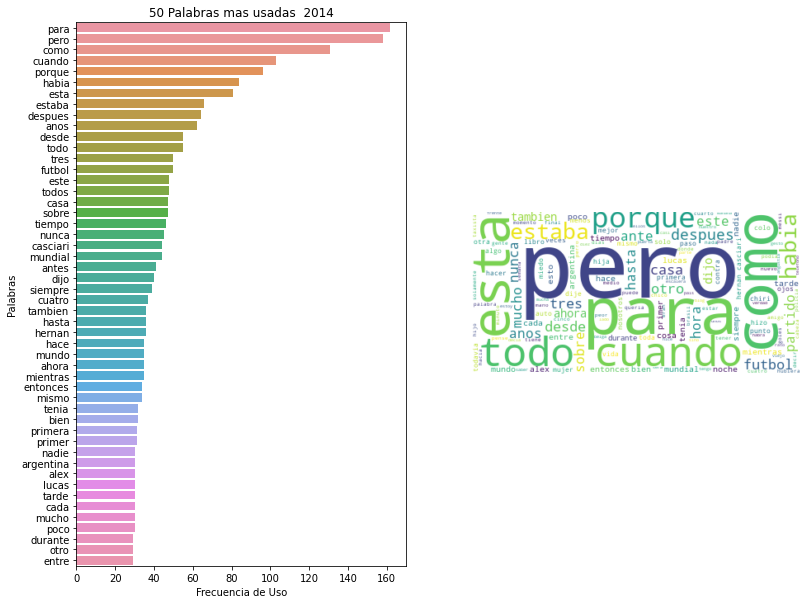

Numero de palabras 2014:5159


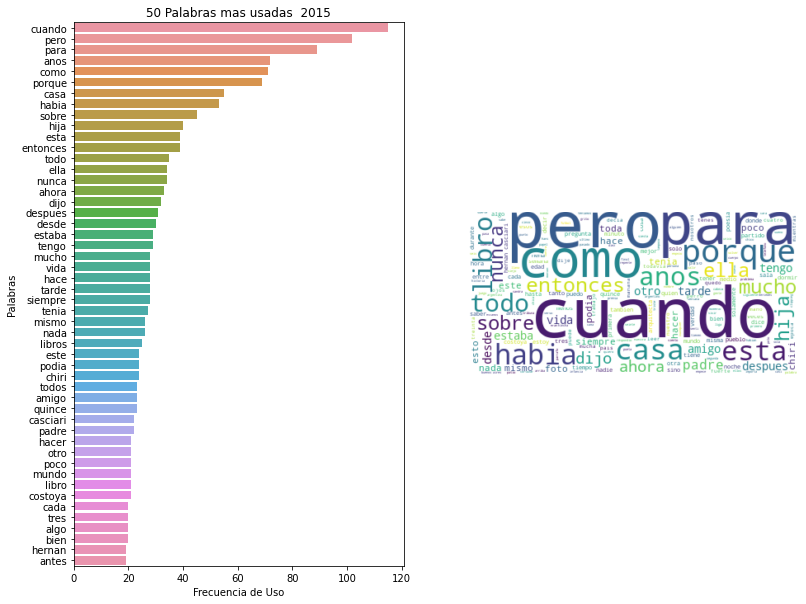

Numero de palabras 2015:3809


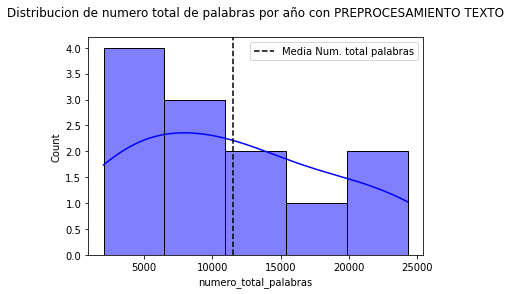

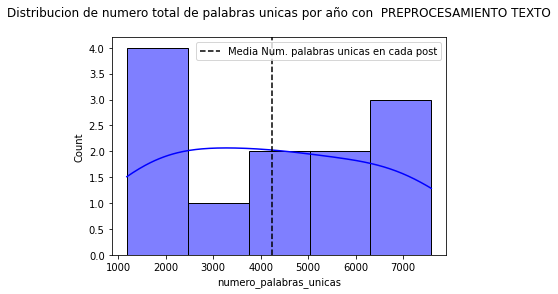

                        count      mean          std     min      25%     50%  \
numero_palabras_unicas   12.0   4241.25  2224.245536  1182.0  2083.75  3981.5   
numero_total_palabras    12.0  11525.25  7458.338630  2063.0  4405.00  9896.0   

                             75%      max  
numero_palabras_unicas   5972.75   7596.0  
numero_total_palabras   15730.75  24308.0  


In [ ]:
from wordcloud import WordCloud


# Diagrama de fecuecia de uso por anio y nube de palabras por anio
def longitud_corpus_por_anio(fila):
    corpus=[]
    vectorizer = CountVectorizer(analyzer='word')
    corpus.append(fila['texto_preprocesado'])
    plot_dtm = vectorizer.fit_transform(corpus)
    plots_df = pd.DataFrame(plot_dtm.toarray(), columns=vectorizer.get_feature_names_out())
    freq_plots= plots_df.sum().sort_values( ascending=False)[0:50]
    _, (ax1, ax2)  = plt.subplots(1, 2,figsize=(13,10))
    ax=sns.barplot(x=freq_plots.values, y=freq_plots.index,ax=ax1)
    ax.set(title='50 Palabras mas usadas  ' +  str(fila['anio']), xlabel='Frecuencia de Uso', ylabel='Palabras')

    wordcloud = WordCloud(background_color = "white").generate(fila['texto_preprocesado'])
    ax2.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    print('Numero de palabras ' + str(fila['anio']) + ':' + str(len(vectorizer.get_feature_names_out())))
    return len(vectorizer.get_feature_names_out())

def histogramas_numero_palabras_por_anio(df):
  df['numero_palabras_unicas'] = df['texto_preprocesado'].apply(vocabulario)              #Obtner el numero de palabras unicas por entrada
  df['numero_total_palabras'] =  df['texto_preprocesado'].apply(numero_palabras_post)     #Obtner el numero de palabras unicas por entrada

  #Distribucion de numero total de palabras  en cada post
  sns.histplot(df['numero_total_palabras'],  kde=True, color='b')
  plt.axvline(df['numero_total_palabras'].mean(), color='k', linestyle='--', label='Media Num. total palabras')
  plt.title('Distribucion de numero total de palabras por año con PREPROCESAMIENTO TEXTO\n '); 
  plt.legend()
  plt.show()
  #Distribucion de numero de palabras  unicas
  sns.histplot(df['numero_palabras_unicas'],   kde=True, color='b')
  plt.axvline(df['numero_palabras_unicas'].mean(), color='k', linestyle='--', label='Media Num. palabras unicas en cada post')
  plt.title('Distribucion de numero total de palabras unicas por año con  PREPROCESAMIENTO TEXTO\n '); 
  plt.legend()
  plt.show()  

  print(df[['numero_palabras_unicas','numero_total_palabras']].describe().T)


## MAIN

# Se agrupapor anio y se ejecuta una funcion de agregacion de join para el texto procesado
df= blog.groupby(['anio'], as_index = False).agg({'texto_preprocesado': ' '.join})
x=df.apply(longitud_corpus_por_anio,axis=1)
histogramas_numero_palabras_por_anio(df)




# Análisis y conclusiones

- Se hace una agrupacion año y posteriormente usando una funcion de agregacion se concatena el texto preprocesado por cada año.<br>
`blog.groupby(['anio'], as_index = False).agg({'texto_preprocesado': ' '.join})`

- Numero de palabras unicas que conforman el texto preprocesado  por año es como sigue:

| Año    | Longitud vocabulario|
| ----------- | ----------- |
|2004    | 4154       |
|2005    | 6875    |
|2006    | 6954       |
|2007    | 5672       |
|2008    | 7596       |
|2009    | 1701       |
|2010    |  1182      |
|2011    |   1957     |
|2012    |    2126    |
|2013    |  3710      |
|2014    |   5159     |
|2015    |    3809    |

- En los diagramas de palabras mas frecuentes y en la nube de palabras por año se observa dentro del diccionario de palabras mas frecuentes a : `pero, para, como , todo, cuando`.  Estas palabras mas frecuentes siguen siendo las preposiciones, adverbios y algunas conjunciones que no fueran eliminadas en la fase de supresion de ruido. Voy a incluir estas al conjunto de stopwords en el siguiente punto.

-  En promedio por año se tiene las siguientes estadisticas:

|     | Media | Desviacion Standart |
| ----------- | ----------- | ----------- |
|numero_palabras_unicas   | 4241       | 2224       |
|numero_total_palabras   | 11525       | 7458       |

  



#### 2.3 ¿Cómo cambia la composición de las palabras más utilizadas por año si remueve las *stopwords* y lematiza? Presente sus resultados usando una nube de palabras por año. Explique de donde salen las *stopwords* que utilizó y si decidió ampliarlas. Note que el escritor es argentino  por lo tanto habrán palabras particulares de este país.

2022-09-18 11:49:22.764477: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.9 MB 12.6 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


{'tuvieseis', 'tuviese', 'siente', 'estaréis', 'suya', 'hubiéramos', 'han', 'hemos', 'hubieron', 'suyos', 'quien', 'como', 'tengamos', 'tengáis', 'tuyas', 'tenías', 'tuyos', 'estad', 'tengo', 'entre', 'estas', 'habríais', 'habría', 'estoy', 'habías', 'hubiésemos', 'tuya', 'hubieseis', 'estuviera', 'tenga', 'contra', 'e', 'él', 'con', 'habéis', 'habíamos', 'estaremos', 'sería', 'mí', 'estos', 'será', 'mío', 'mi', 'estuvimos', 'eso', 'habrá', 'también', 'habido', 'fui', 'ante', 'tuvo', 'teníais', 'sobre', 'nuestro', 'estuvisteis', 'ni', 'tendrías', 'míos', 'tenéis', 'serás', 'tienen', 'todos', 'estaba', 'tuvimos', 'las', 'tendremos', 'otros', 'al', 'tuviésemos', 'su', 'fueron', 'hubieses', 'habré', 'esos', 'estabas', 'de', 'otras', 'habrán', 'estarás', 'seréis', 'tendrá', 'tus', 'habían', 'hube', 'estará', 'hubierais', 'serían', 'te', 'mías', 'un', 'no', 'tanto', 'mis', 'tendría', 'estar', 'hubimos', 'vuestros', 'tenida', 'poco', 'estaban', 'seas', 'los', 'tienes', 'estaríamos', 'hubo', 

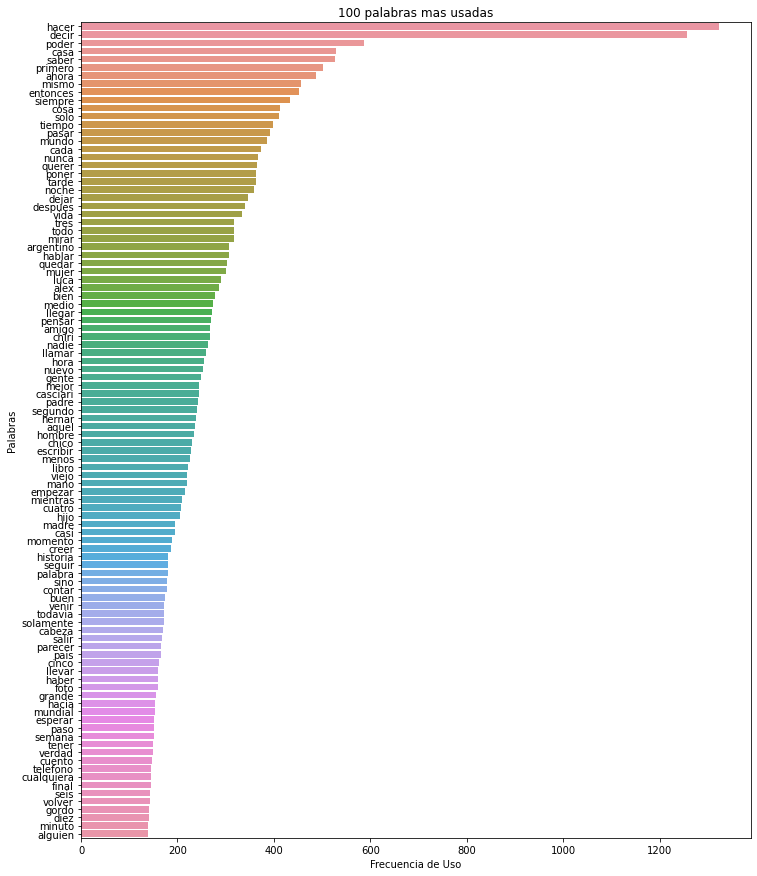

Numero de palabras en todo el corpus 17239



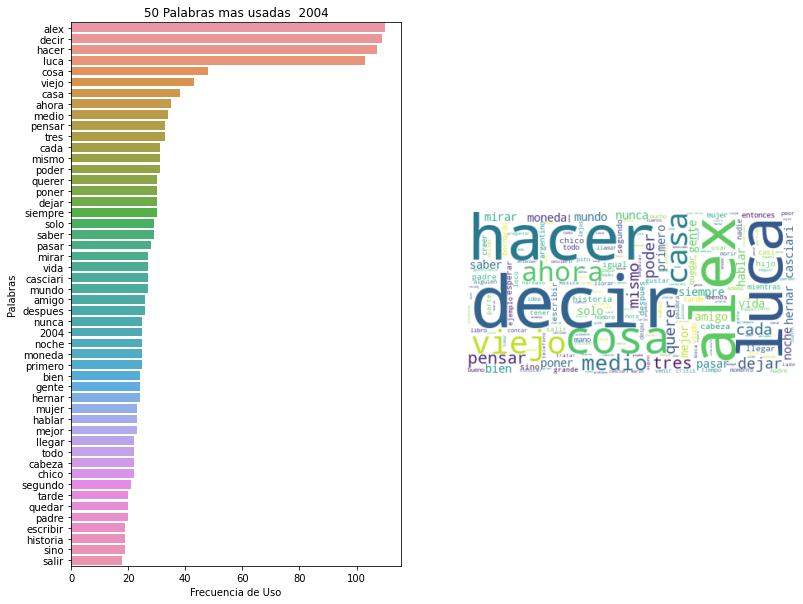

Numero de palabras 2004:3339


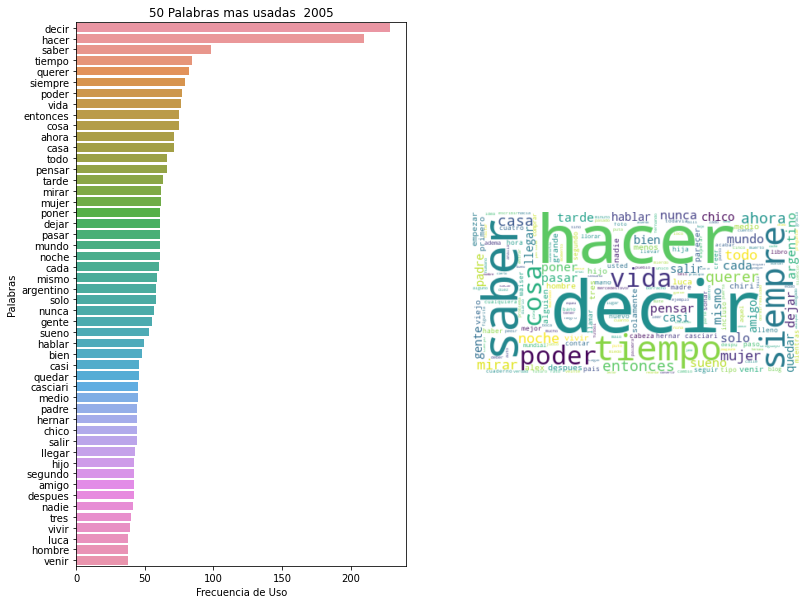

Numero de palabras 2005:5508


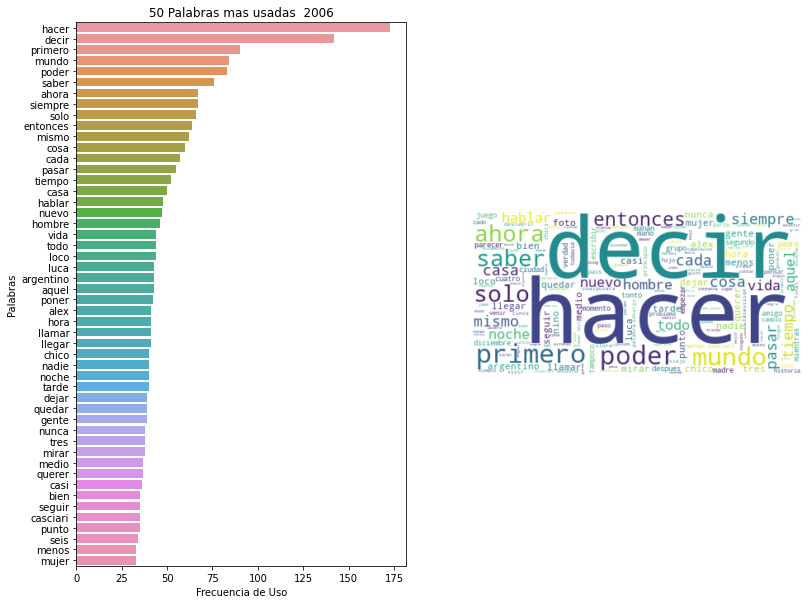

Numero de palabras 2006:5592


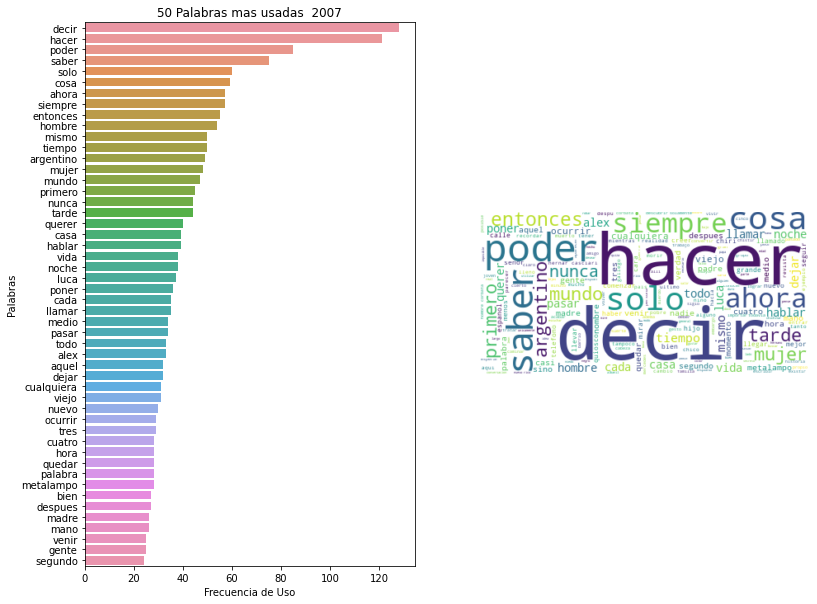

Numero de palabras 2007:4527


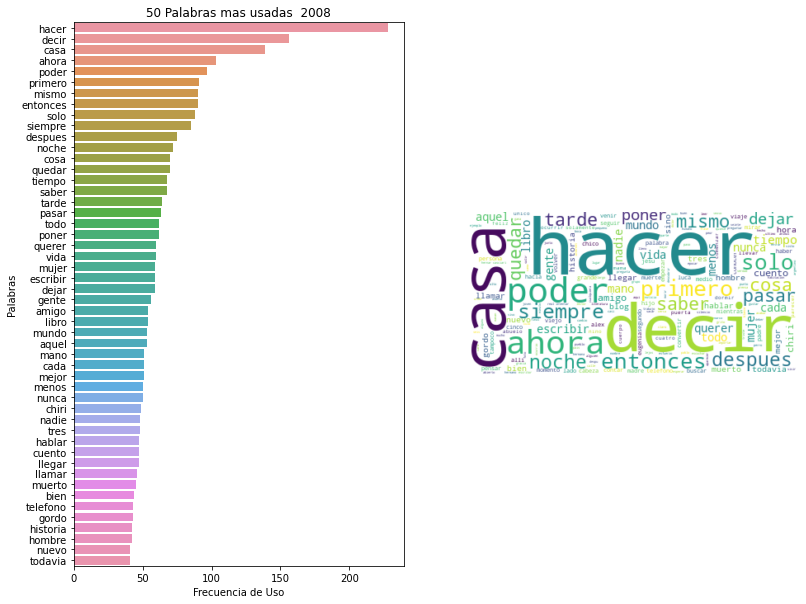

Numero de palabras 2008:5963


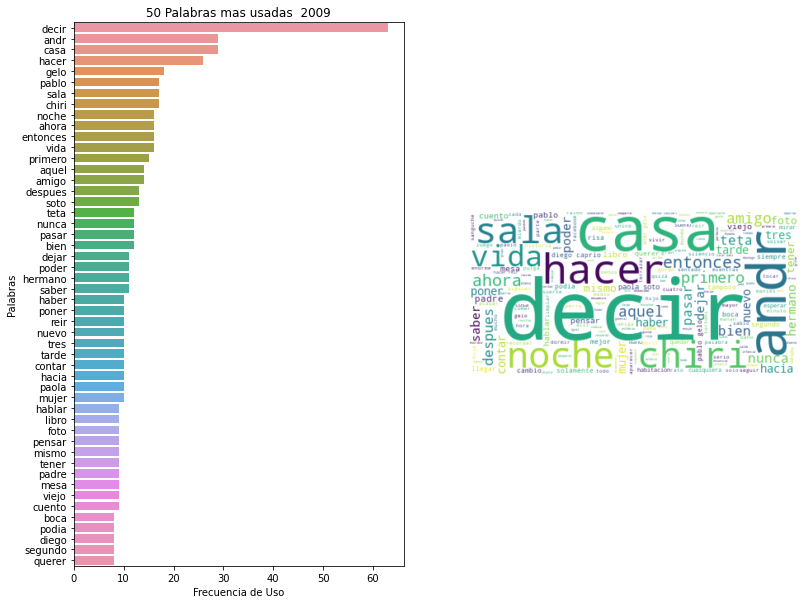

Numero de palabras 2009:1374


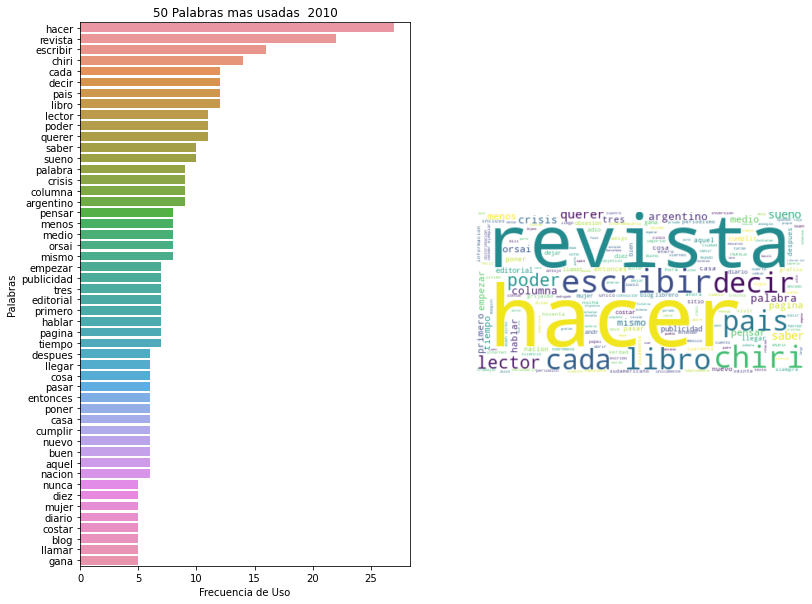

Numero de palabras 2010:979


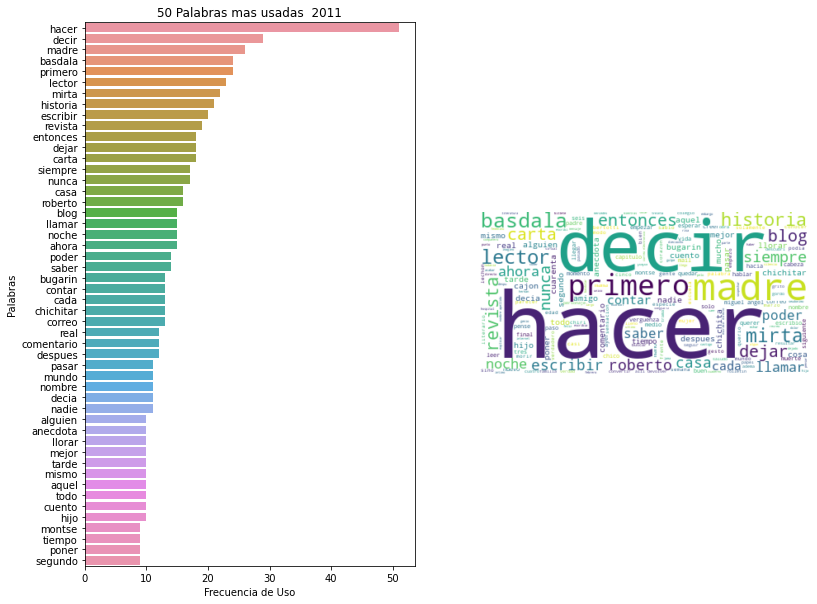

Numero de palabras 2011:1614


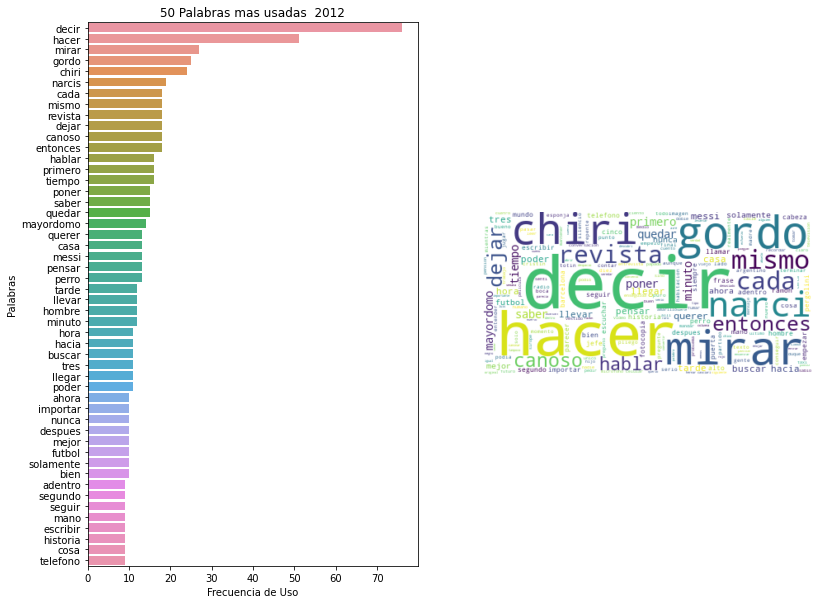

Numero de palabras 2012:1731


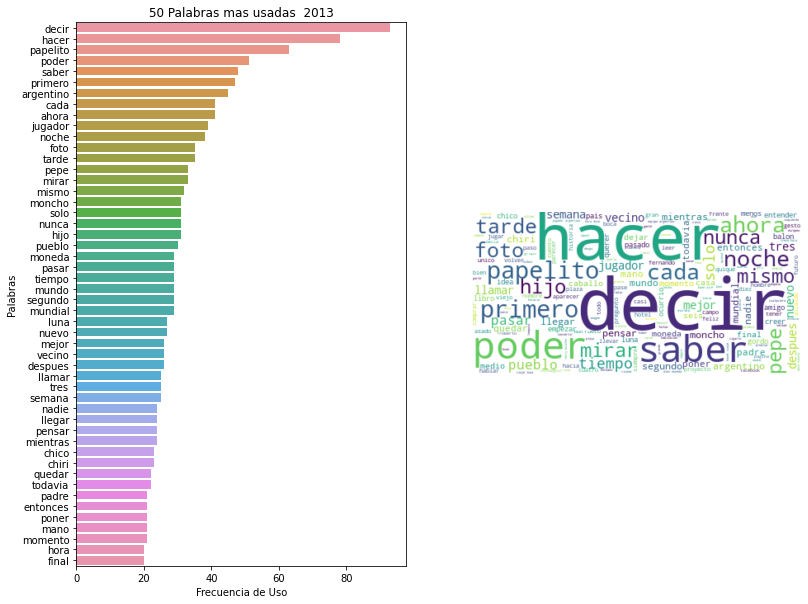

Numero de palabras 2013:2989


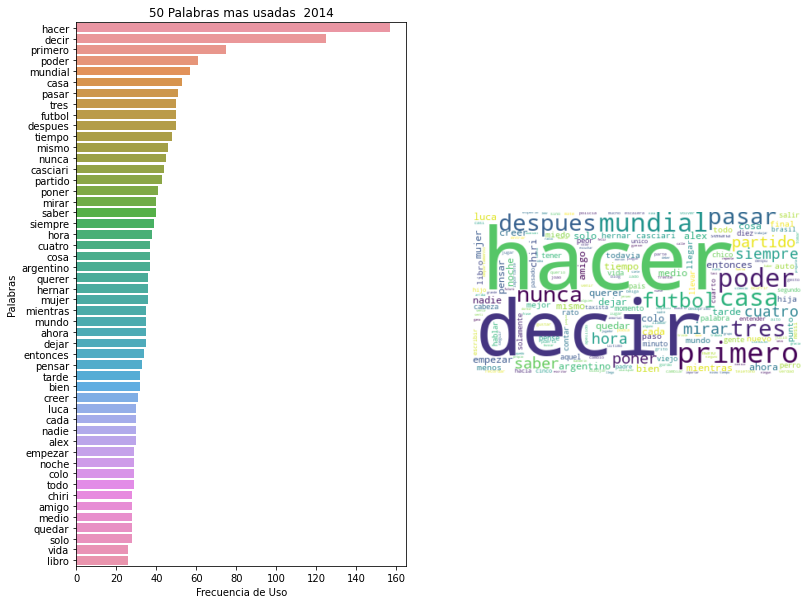

Numero de palabras 2014:4192


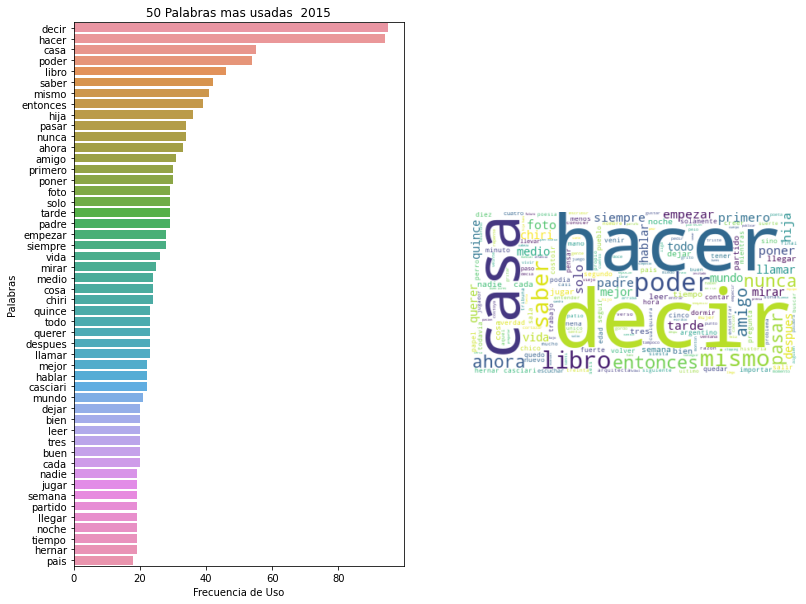

Numero de palabras 2015:3034


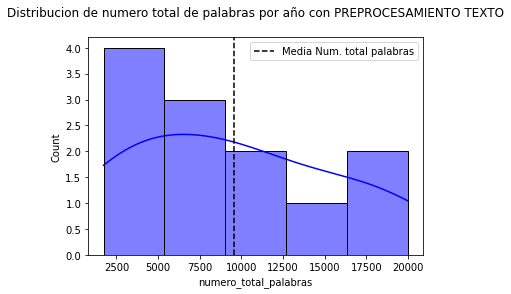

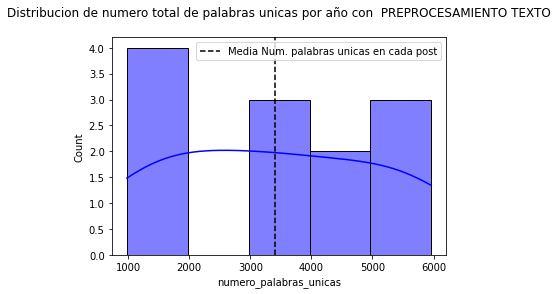

                        count     mean          std     min      25%     50%  \
numero_palabras_unicas   12.0  3403.50  1757.131314   979.0  1701.75  3186.5   
numero_total_palabras    12.0  9538.75  6162.049484  1725.0  3636.25  8189.5   

                             75%      max  
numero_palabras_unicas   4772.25   5963.0  
numero_total_palabras   13173.25  19996.0  


In [ ]:
!python -m spacy download es_core_news_sm
!pip install Unidecode
import nltk
import re 
from nltk.corpus import stopwords
from unidecode import unidecode
import spacy

#Remover stopwords
def remover_stopwords(texto, stop_words):
    pattern = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)
    return pattern.sub(" ", texto)

#Lematizar
def lematizar(texto):
    doc = nlp(texto)
    return ' '.join([token.lemma_ for token in doc])

# MAIN -SUPRESION DE STOPWORS Y LEMATIZACION 
nltk.download('stopwords')
nlp = spacy.load("es_core_news_sm")
lista_stopwords = set(stopwords.words("spanish"))
lista_stopwords.update(['como', 'todo','pero', 'para', 'cuando'])
print(lista_stopwords)
lista_stopwords = [unidecode(stopword) for stopword in lista_stopwords] # Se limpian los stopword
lista_stopwords = set(lista_stopwords)
  
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remover_stopwords(texto,lista_stopwords))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: lematizar(texto))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: unidecode(texto))
blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remover_palabras_longitud_menor(texto,4))


blog['texto_preprocesado'] = blog['texto_preprocesado'].apply(lambda texto: remove_extra_espacios(texto))
frecuencia_uso_palabras(blog["texto_preprocesado"])

df= blog.groupby(['anio'], as_index = False).agg({'texto_preprocesado': ' '.join})
df.apply(longitud_corpus_por_anio,axis=1)
histogramas_numero_palabras_por_anio(df)



# Análisis
- Los stopwords se descargan del corpus de nltk.  Al observar en detalle los stopwords en español, hay palabras con tilde. Dado que se homogenizo el texto del cuento , tambien se debe homogenizar estas palabras para remover tildes.

- Se adicionan al vocabulario de stopwords las palabras `[como, todo,pero, para]`

-  Todo el corpus  del nuevo texto preprocesado esta conformado por un vocabulario de 17239 palabras unicas.

- La composicion del corpus se transforma, porque hay  palabras en su forma base de diccionario. Las palabras mas frecuentes son `hacer, decir, casa, poder, saber`.


- Numero de palabras unicas que conforman el texto preprocesado  por año es como sigue:

| Año    | Longitud vocabulario|
| ----------- | ----------- |
|2004    | 3339       |
|2005    | 5508    |
|2006    | 5592       |
|2007    | 4527       |
|2008    | 5963       |
|2009    | 1374       |
|2010    |  1374      |
|2011    |   1614     |
|2012    |    1731    |
|2013    |  2989      |
|2014    |   4192     |
|2015    |    3034    |

-  En promedio por año se tiene las siguientes estadisticas:

|     | Media | Desviacion Standart |
| ----------- | ----------- | ----------- |
|numero_palabras_unicas   | 3403       | 1757       |
|numero_total_palabras   | 9538     | 6162       |




#### 2.4 Obtenga una tabla y/o gráfica que muestre el total de posts por año, el promedio de palabras por post, el total de palabras utilizadas y el total de palabras únicas.

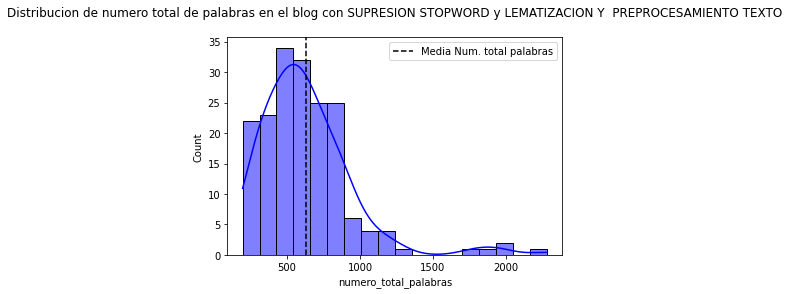

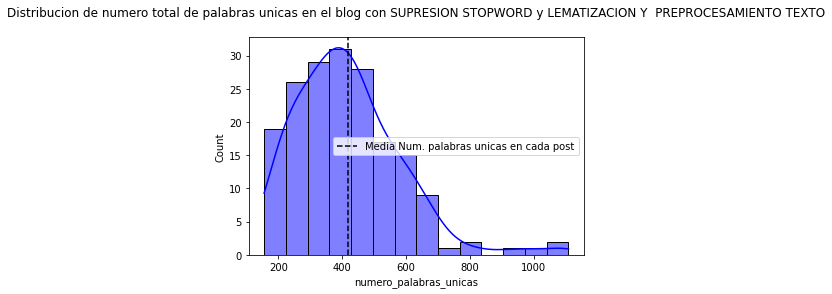

                        count        mean         std    min    25%    50%  \
numero_palabras_unicas  181.0  417.939227  165.789765  155.0  295.0  407.0   
numero_total_palabras   181.0  632.403315  320.879413  196.0  428.0  573.0   

                          75%     max  
numero_palabras_unicas  502.0  1109.0  
numero_total_palabras   774.0  2282.0  


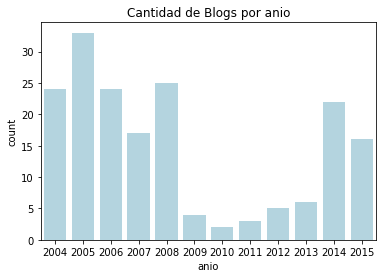

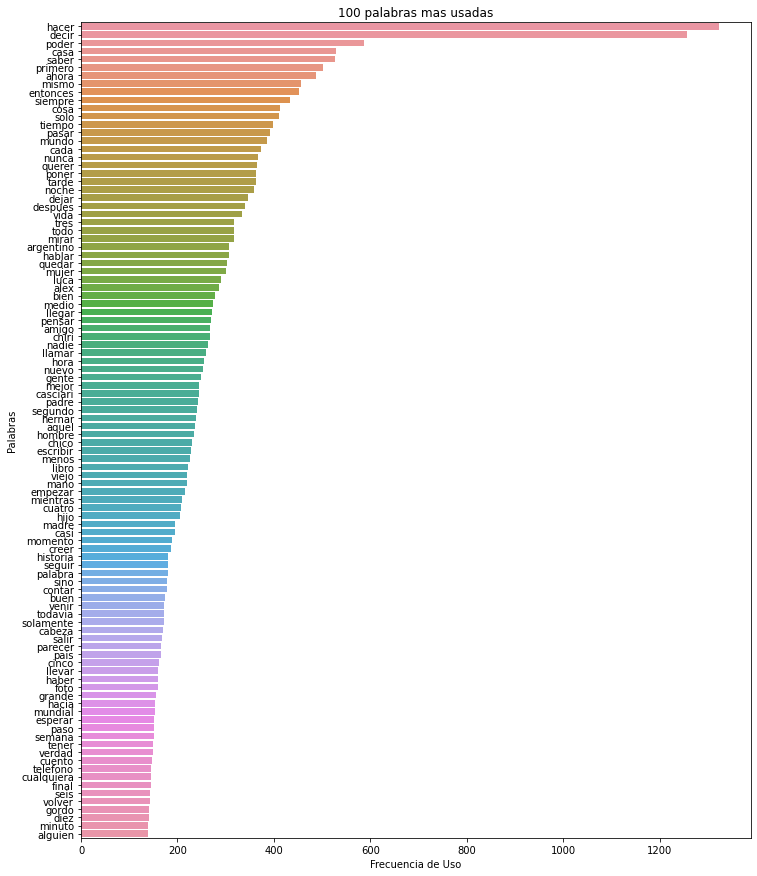

Numero de palabras en todo el corpus 17239



In [ ]:

# MAIN
df= blog.copy()
histogramas_numero_palabras(df,'texto_preprocesado','con SUPRESION STOPWORD y LEMATIZACION Y ')         


#Cantidad de Blogs por anio
sns.countplot(data = blog, x = 'anio',color = 'lightblue' )
plt.title('Cantidad de Blogs por anio'); 
plt.show()

frecuencia_uso_palabras(blog["texto_preprocesado"])


# Análisis

-  Todo el corpus  del nuevo texto preprocesado esta conformado por un vocabulario de 17239  palabras unicas.

- El diagrama de palabras mas frecuentes, se revelan las palabras  `hacer, decir, casa, poder, saber`.
-  En promedio  cada entrada consta de:

|     | Media | Desviacion Standart |
| ----------- | ----------- | ----------- |
|numero_palabras_unicas   | 417       | 165       |
|numero_total_palabras   | 632       | 320       |

### 3. Generando Recomendaciones

En esta sección nos interesa generar recomendaciones, para ello va a elegir una entrada de la base que le pareció interesante y generar recomendaciones para ella utilizando distintos procedimientos

#### 3.1. Basados en similitud  utilizando CountVectorizer

Genere una función recomendadora basado en la distancia de coseno donde el texto este vactorizado por `CountVectorizer`. Muestre y describa las 10 entradas más recomendadas.

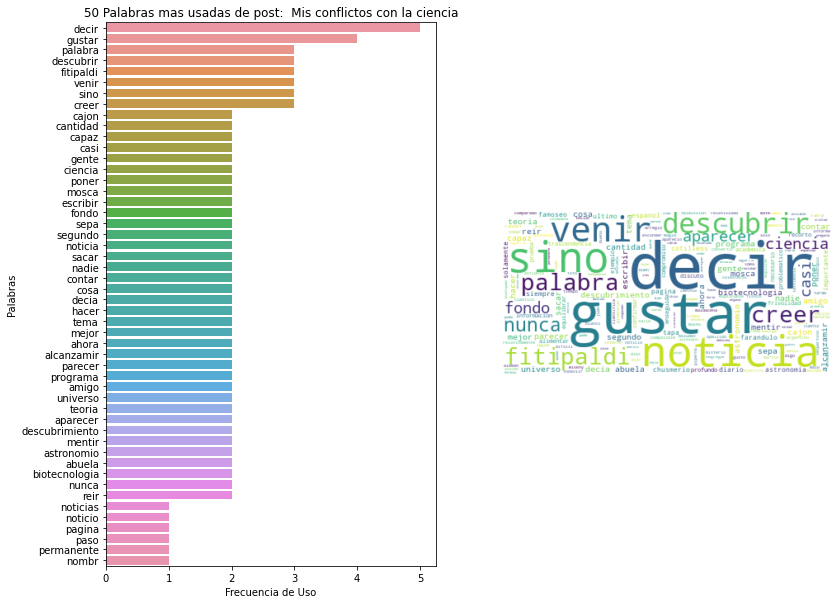

Longitud Vocabulario Mis conflictos con la ciencia:210
POST A RECOMENDAR:

54         Nunca le abras la puerta a un chino
141                              Gaussian blur
129                                     Lechón
112               Dice el Chiri, dice el Gordo
6                          El futuro del Chape
108                        El uno para el otro
97            La madre de todas las desgracias
87        El tajo de un cuchillo en el abdomen
121    Una charla sobre la muerte de los blogs
143                         La falsa biografía
Name: titulo, dtype: object

CARACTERIZACION DE LOS TITULOS  A RECOMENDAR:



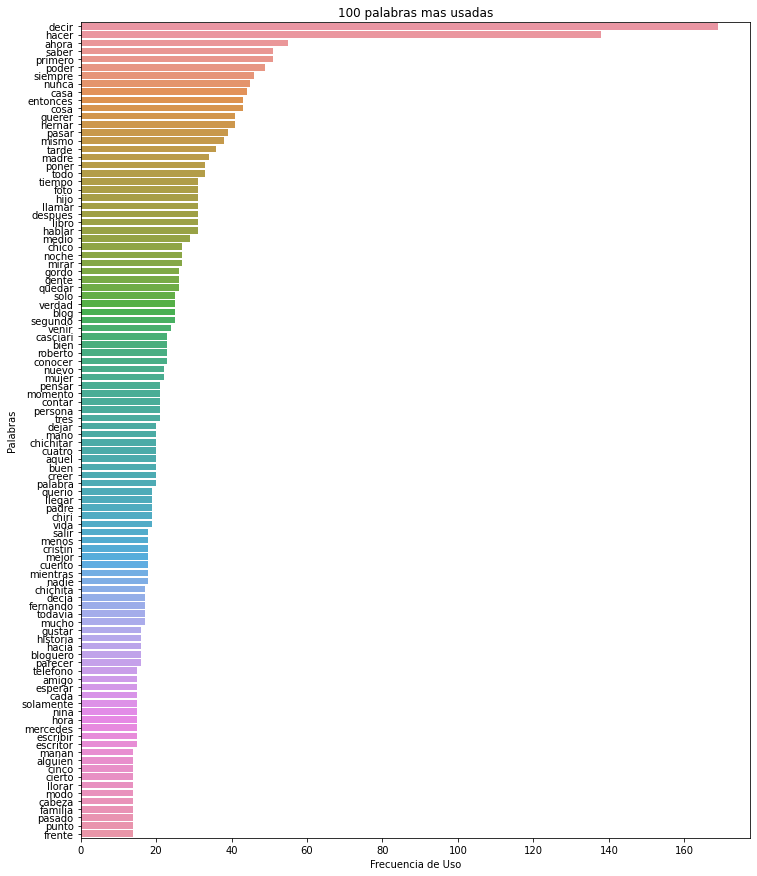

Numero de palabras en todo el corpus 3130



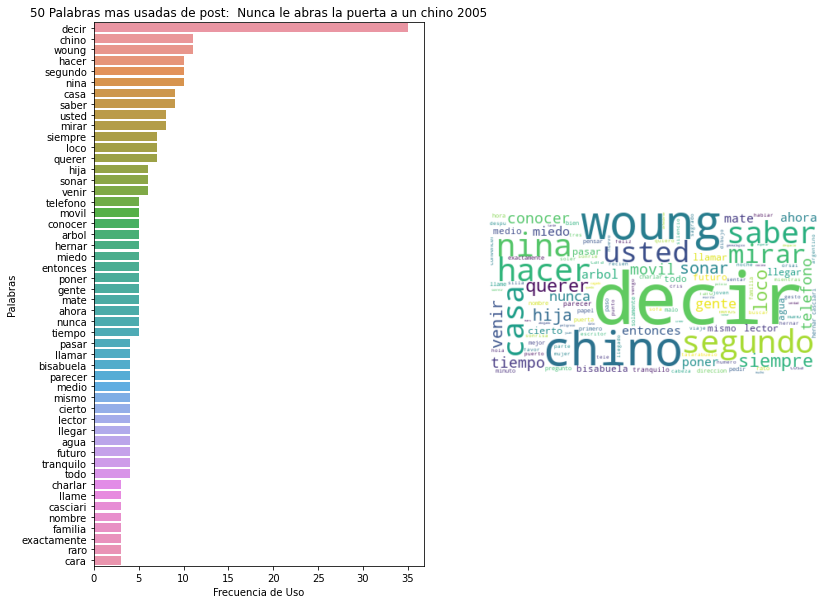

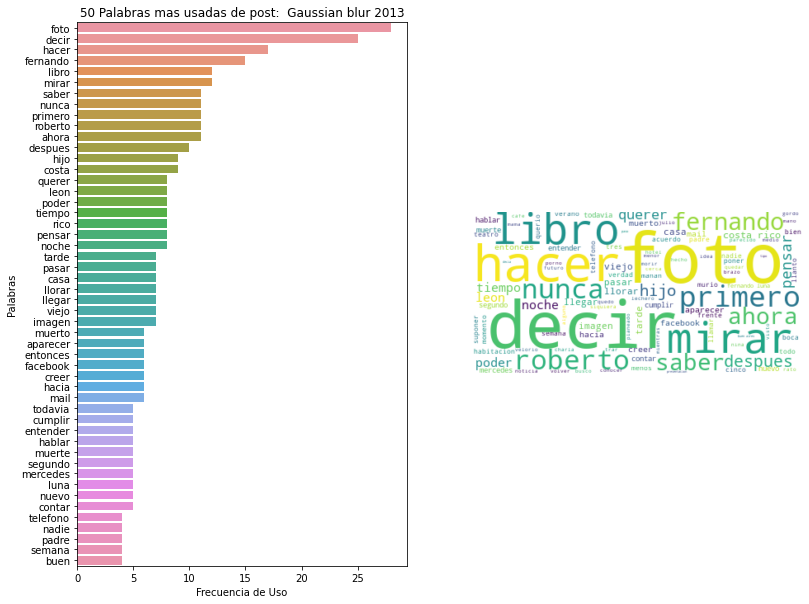

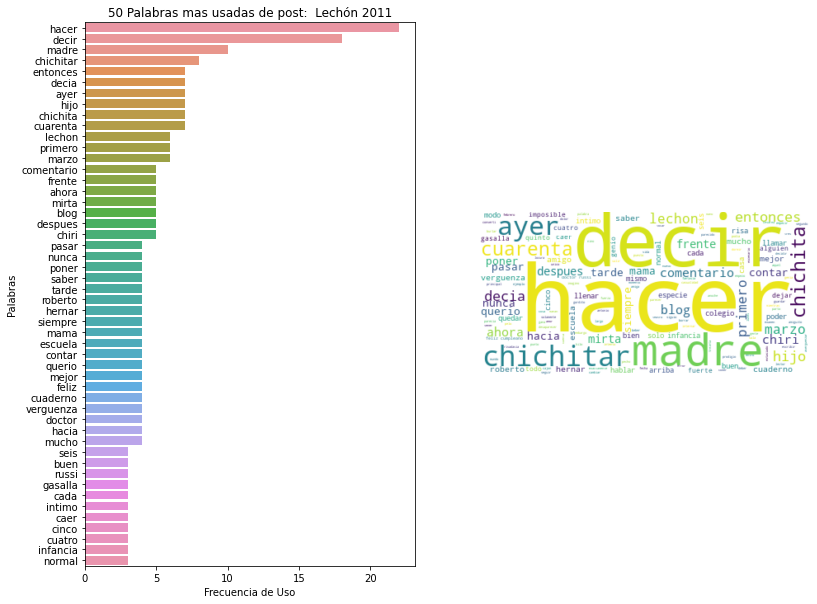

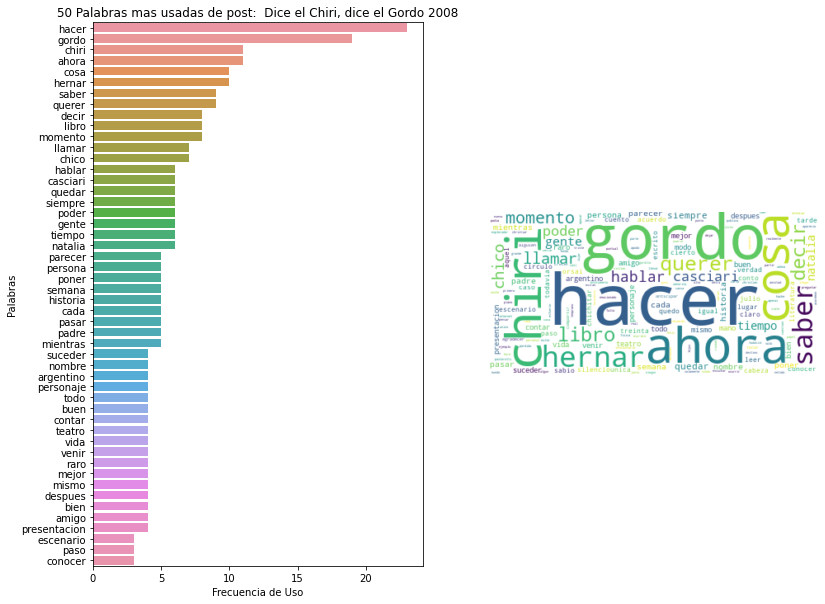

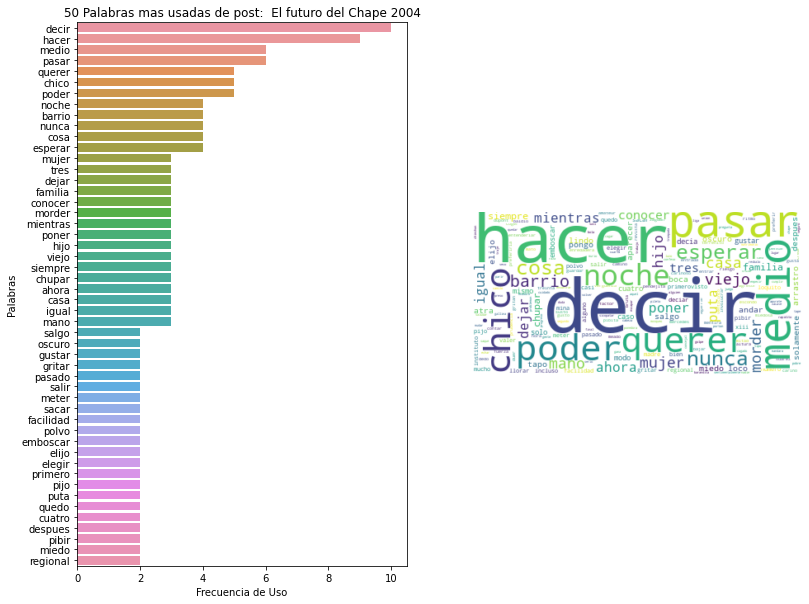

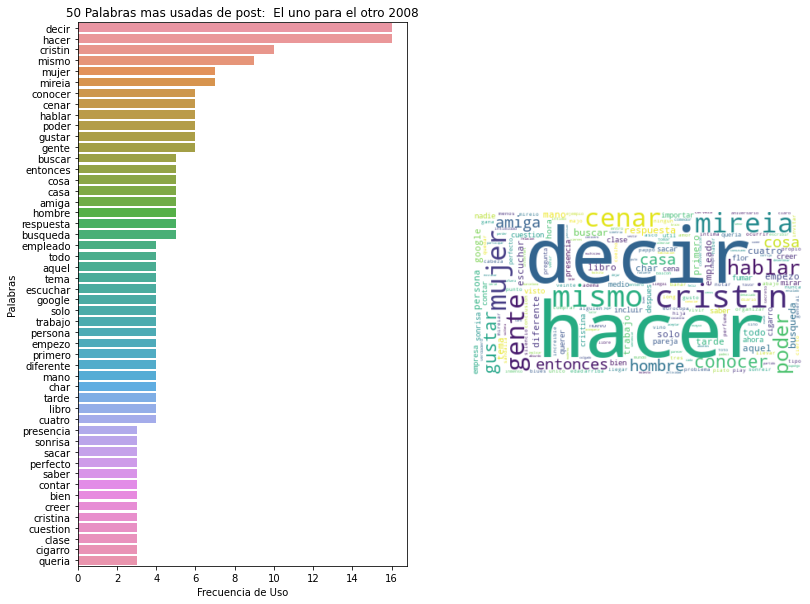

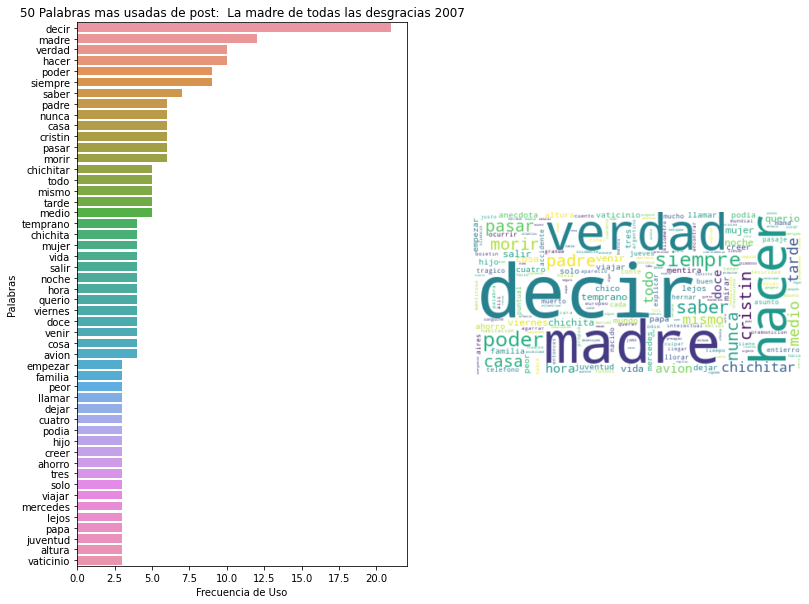

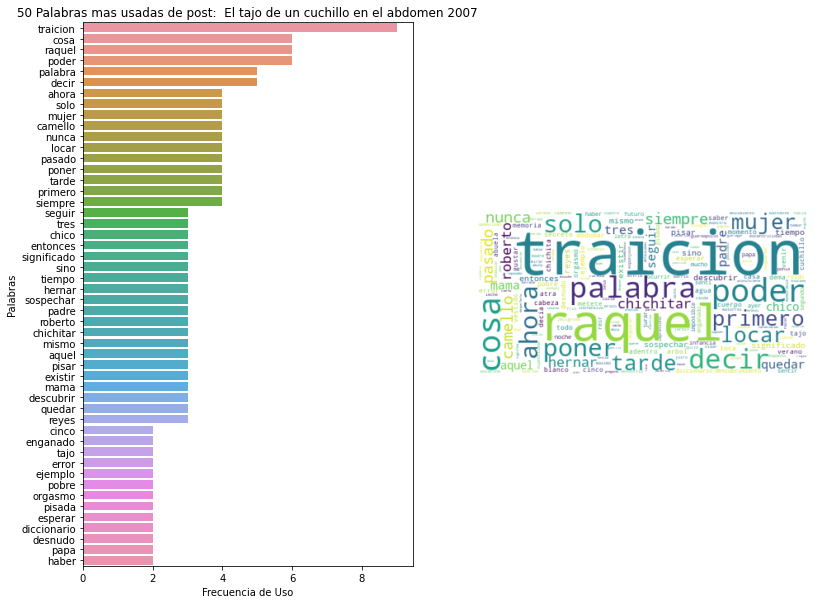

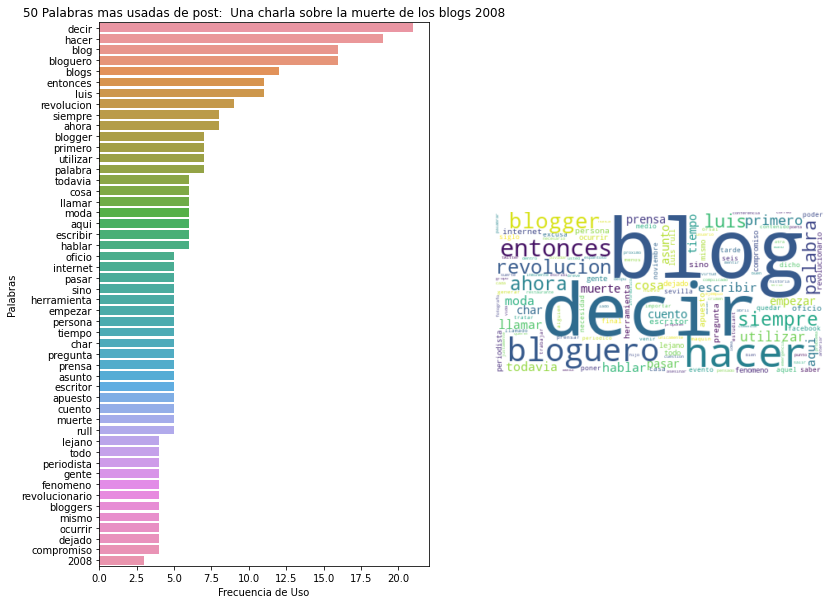

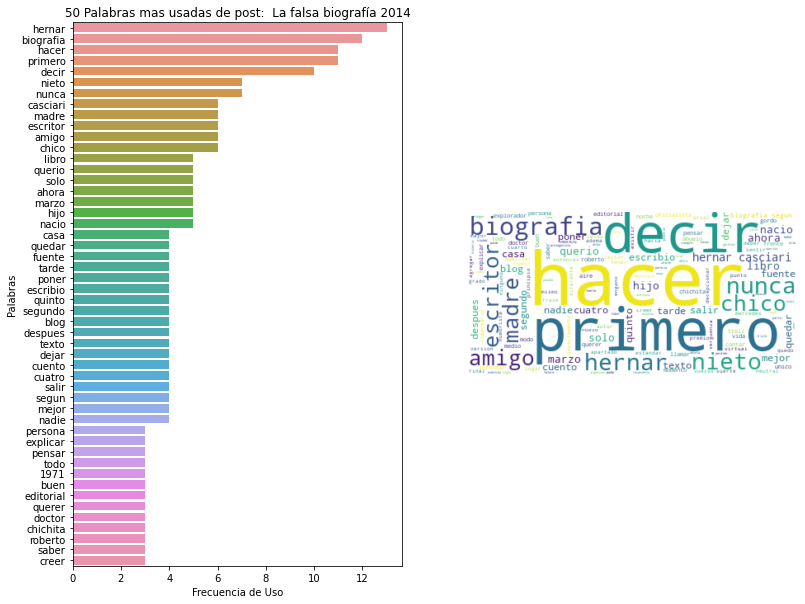

54     471
141    674
129    525
112    639
6      347
108    561
97     574
87     432
121    605
143    649
dtype: int64

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# Fecuecia de uso de plabras y nube de palabras del tiuulo de referencia

def caracterizacion(titulo,texto_cuento):
    corpus=[]
    vectorizer = CountVectorizer(analyzer='word')
    corpus.append(texto_cuento)
    plot_dtm = vectorizer.fit_transform(corpus)
    plots_df = pd.DataFrame(plot_dtm.toarray(), columns=vectorizer.get_feature_names_out())
    freq_plots= plots_df.sum().sort_values( ascending=False)[0:50]
    _, (ax1, ax2)  = plt.subplots(1, 2,figsize=(13,10))
    ax=sns.barplot(x=freq_plots.values, y=freq_plots.index,ax=ax1)
    ax.set(title='50 Palabras mas usadas de post:  ' + titulo, 
          xlabel='Frecuencia de Uso', 
          ylabel='Palabras')

    wordcloud = WordCloud(background_color = "white").generate(texto_cuento)
    ax2.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()  
    print(f'Longitud Vocabulario {titulo}:{len(vectorizer.get_feature_names_out())}')

# Fecuecia de uso de plabras y nube de palabras de las recomendaiocnes
def caracterizacion_post(fila):
    corpus=[]
    vectorizer = CountVectorizer(analyzer='word')
    corpus.append(fila['texto_preprocesado'])
    plot_dtm = vectorizer.fit_transform(corpus)
    plots_df = pd.DataFrame(plot_dtm.toarray(), columns=vectorizer.get_feature_names_out())
    freq_plots= plots_df.sum().sort_values( ascending=False)[0:50]
    _, (ax1, ax2)  = plt.subplots(1, 2,figsize=(13,10))
    ax=sns.barplot(x=freq_plots.values, y=freq_plots.index,ax=ax1)
    ax.set(title='50 Palabras mas usadas de post:  ' + fila['titulo'] + ' ' + str(fila['anio']), 
          xlabel='Frecuencia de Uso', 
          ylabel='Palabras')

    wordcloud = WordCloud(background_color = "white").generate(fila['texto_preprocesado'])
    ax2.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    return len(vectorizer.get_feature_names_out())


#Funcion recomendadora
def recomendador(titulo, df, matrix_similaridades,num_recomendaciones=10 ):
    df= df.reset_index()
    indice=df.index[df['titulo'] == titulo].tolist()[0]
    post_similares = list(enumerate(matrix_similaridades[indice]))
    post_similares = sorted(post_similares, key=lambda x: x[1], reverse=True)
    post_similares = post_similares[1:num_recomendaciones+1]
    post_indices = [i[0] for i in post_similares]
    return df.iloc[post_indices]

# MAIN

# Obtener maytriz de conteo 
vectorizer = CountVectorizer(analyzer='word')
conteo_matrix = vectorizer.fit_transform(blog['texto_preprocesado'])
# Calcular la matriz de similaridad
matrix_similaridades = cosine_similarity(conteo_matrix)
df= blog.copy()
#Caracterizacion del titulo base atraves de frecuencia de uso de palbras y nube de palabras
titulo = "Mis conflictos con la ciencia"
df[df['titulo']==titulo]['texto_preprocesado'].apply(lambda texto: caracterizacion(titulo,texto))
x= recomendador(titulo,df, matrix_similaridades)
print('POST A RECOMENDAR:\n')
print(x['titulo'])

# Frecuecia de uso de plabras y nube de palabras de las recomendaciones
print('\nCARACTERIZACION DE LOS TITULOS  A RECOMENDAR:\n')
frecuencia_uso_palabras(x["texto_preprocesado"])
x.apply(caracterizacion_post,axis=1)

# Análisis
- Con CountVectorizer, se obtiene  la matriz de conteo. 

- Con esta matriz de conteo , se obtiene la matriz de similaridad.

- Con la funcion recomendador, se ordena la matriz de similaridad y se extrae las 10 recomendaciones similares.

- Se hace una caracterizacion del titulo base:"Mis conflictos con la ciencia". Este cuento tiene una longitud de palabras unicas 206, y las tres  palabras mas frecuentes son: decir, gustar y noticia
- Una vez se obtiene las 10 recomendaciones  del titulo "Mis conflictos con la ciencia"; se hace una caracterizacion de cada recomendacion con base en el diagrama de frecuencias y se obtiene :





| Titulo    | Longitud vocabulario|
| ----------- | ----------- |
|Nunca le abras la puerta a un chino    | 471       |
|Gaussian blur    | 674       |
|Lechón    | 525       |
|Dice el Chiri, dice el Gordo    | 639       |
|El futuro del Chape    | 347       |
|El uno para el otro    | 561       |
| La madre de todas las desgracias   | 574       |
|El tajo de un cuchillo en el abdomen   | 432       |
|Una charla sobre la muerte de los blogs   | 605       |
|La falsa biografía  | 649       | 





#### 3.2.  Basados en similitud  utilizando TF-IDFVectorizer

Genere una función recomendadora basado en la distancia de coseno donde el texto este vectorizado  por `TF-IDFVectorizer`. Muestre y describa las 10 entradas más recomendadas. Compare con los resultados encontrados anteriormente y explique sus similitudes y/o diferencias.

POST A RECOMENDAR:

141                            Gaussian blur
129                                   Lechón
112             Dice el Chiri, dice el Gordo
54       Nunca le abras la puerta a un chino
116               Los cinco críticos feroces
6                        El futuro del Chape
97          La madre de todas las desgracias
165         Diez razones para hacer silencio
87      El tajo de un cuchillo en el abdomen
72     Los problemas de evitar el copy-paste
Name: titulo, dtype: object

CARACTERIZACION DE LOS TITULOS  A RECOMENDAR:



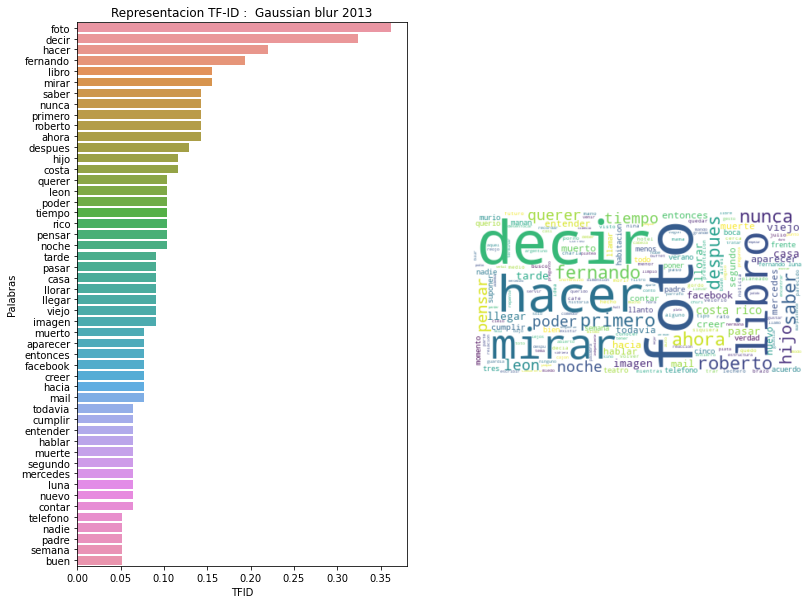

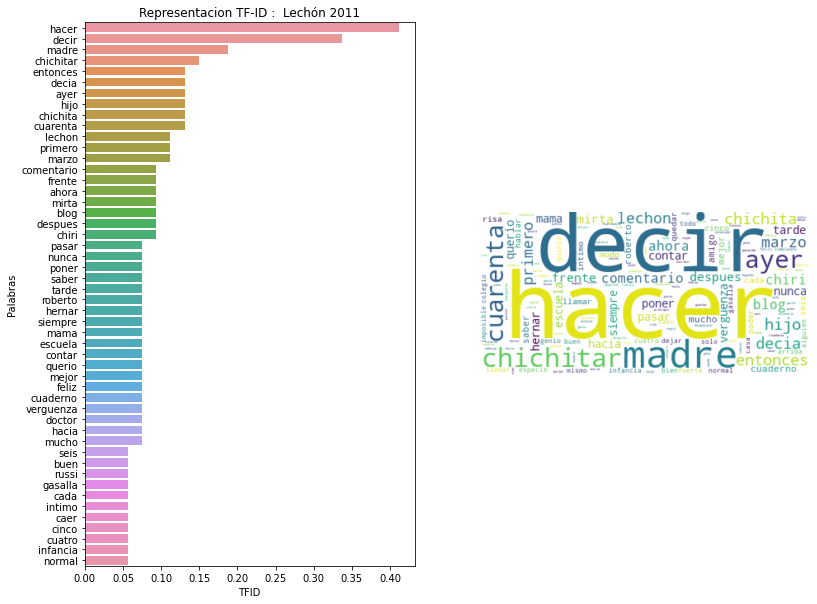

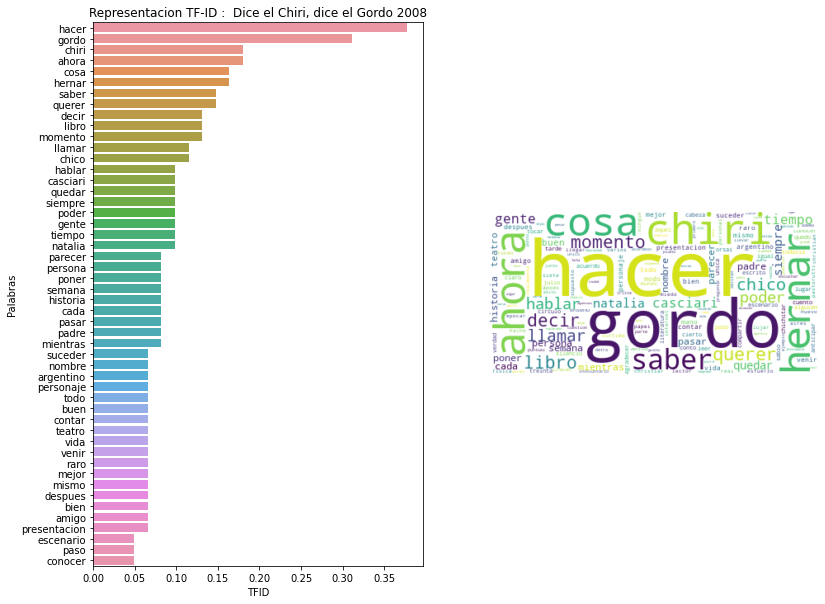

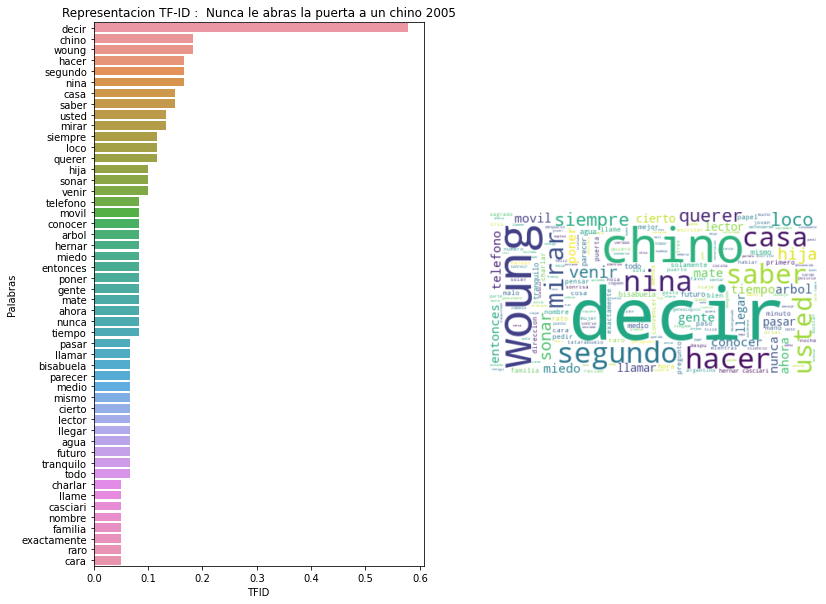

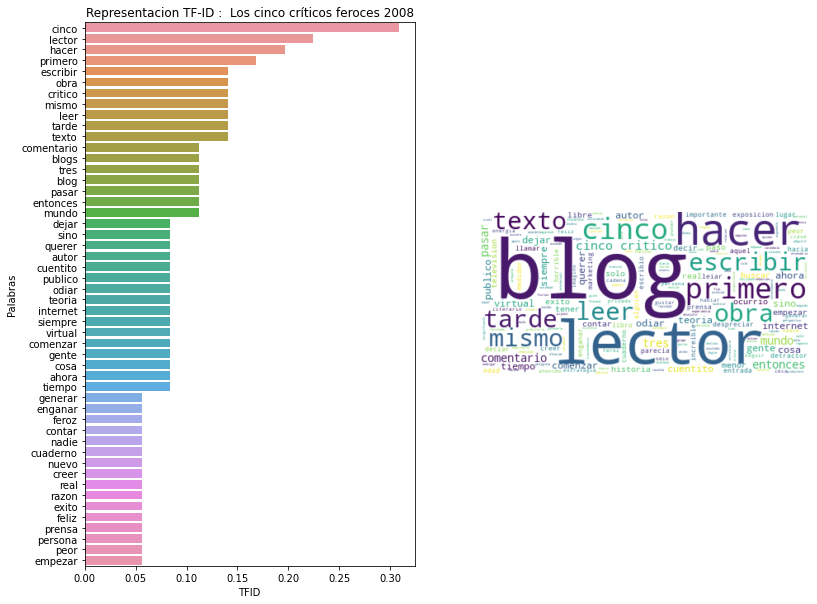

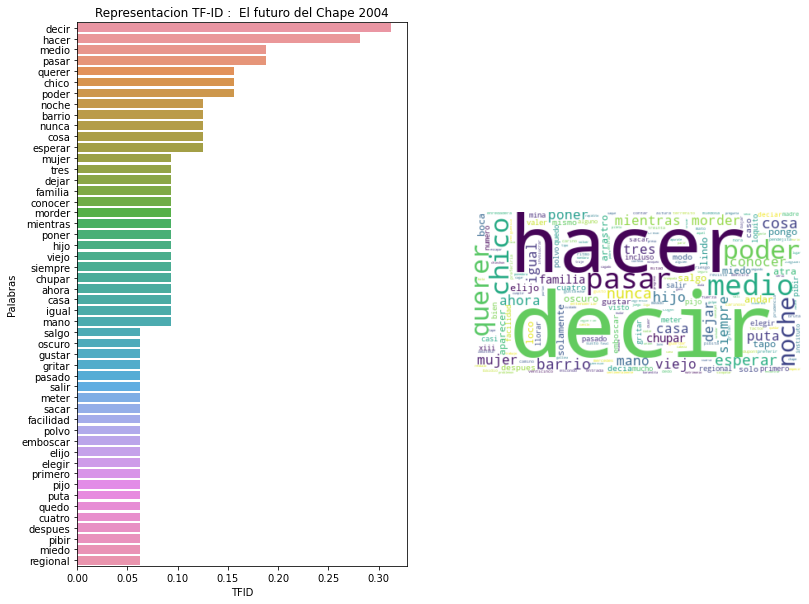

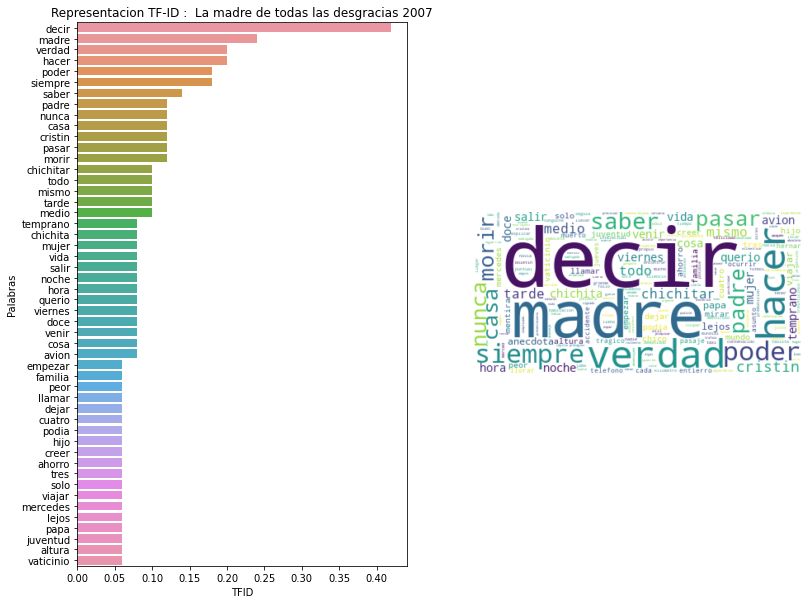

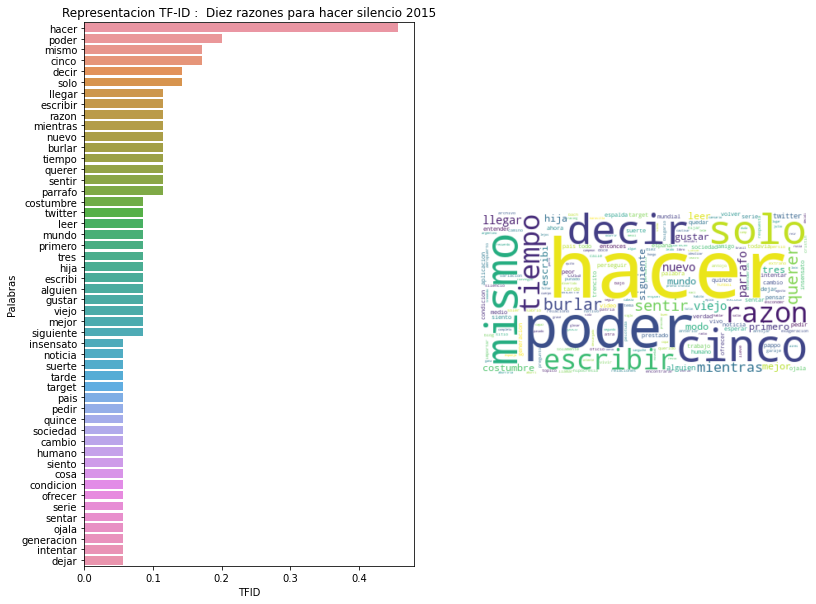

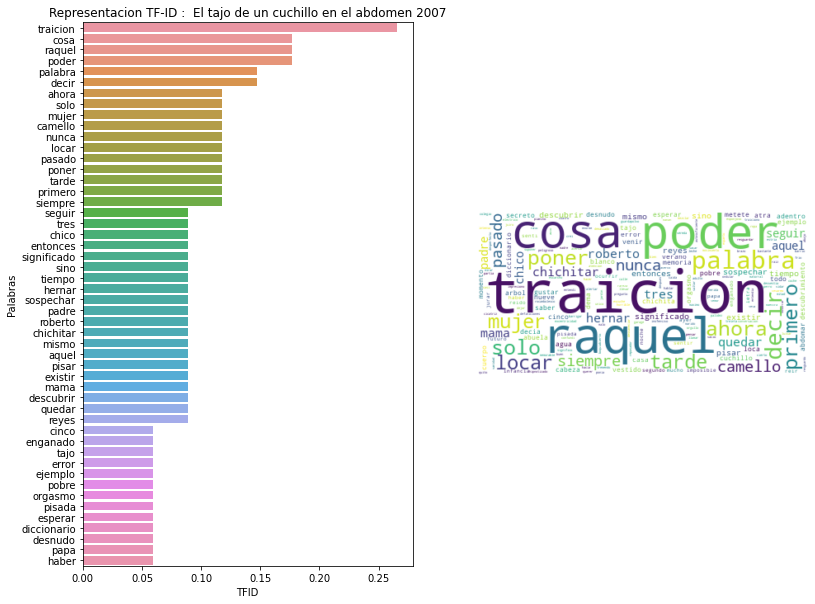

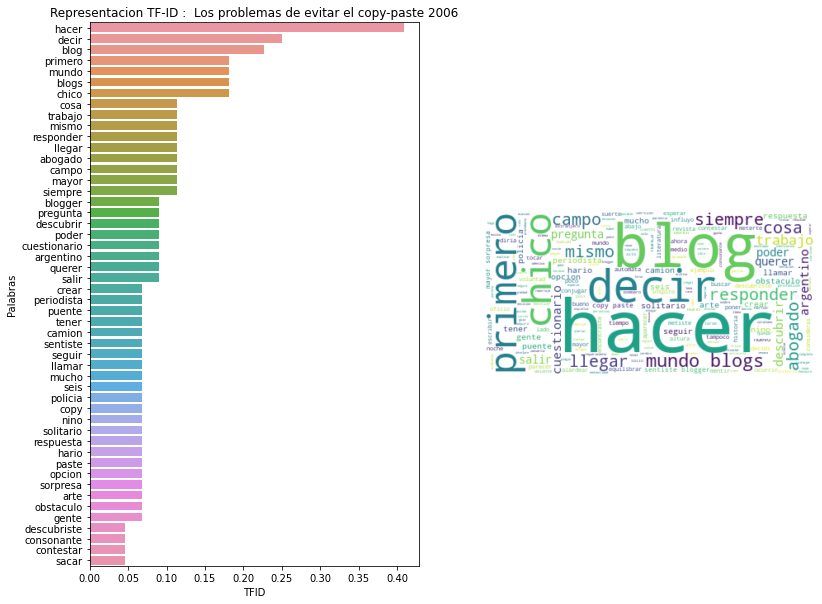

141    674
129    525
112    639
54     471
116    421
6      347
97     574
165    411
87     432
72     454
dtype: int64

In [ ]:
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import TfidfVectorizer

def caracterizacion_post(fila):
    corpus=[]
    vectorizer = TfidfVectorizer(analyzer='word')
    corpus.append(fila['texto_preprocesado'])
    plot_dtm = vectorizer.fit_transform(corpus)
    plots_df = pd.DataFrame(plot_dtm.toarray(), columns=vectorizer.get_feature_names_out())
    freq_plots= plots_df.sum().sort_values( ascending=False)[0:50]
    _, (ax1, ax2)  = plt.subplots(1, 2,figsize=(13,10))
    ax=sns.barplot(x=freq_plots.values, y=freq_plots.index,ax=ax1)
    ax.set(title='Representacion TF-ID :  ' + fila['titulo'] + ' ' + str(fila['anio']), 
          xlabel='TFID', 
          ylabel='Palabras')

    wordcloud = WordCloud(background_color = "white").generate(fila['texto_preprocesado'])
    ax2.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    return len(vectorizer.get_feature_names_out())

## MAIN

tfidf = TfidfVectorizer(analyzer='word')
tfidf_matrix = tfidf.fit_transform(blog['texto_preprocesado'])
tfidf_matrix.shape
matrix_similaridades = linear_kernel(tfidf_matrix, tfidf_matrix)
df= blog.copy()
titulo = "Mis conflictos con la ciencia"
x= recomendador(titulo,df, matrix_similaridades)
print('POST A RECOMENDAR:\n')
print(x['titulo'])
# Frecuecia de uso de plabras y nube de palabras de las recomendaciones
print('\nCARACTERIZACION DE LOS TITULOS  A RECOMENDAR:\n')
x.apply(caracterizacion_post,axis=1)

# Análisis
- Con TfidVectorizer, se obtiene la matriz de  tf-id (term-frequency times inverse document-frequency)

- Con esta matriz de conteo , se obtiene la matriz de similaridad.

- Con la funcion recomendador, se ordena la matriz de similaridad y se extrae las 10 recomendaciones similares.

- Se hace una caracterizacion del titulo base:"Mis conflictos con la ciencia". Este cuento tiene una longitud de palabras unicas 206, y las tres  palabras mas frecuentes son: decir, gustar y noticia
- Una vez se obtiene las 10 recomendaciones  del titulo "Mis conflictos con la ciencia"; se hace una caracterizacion de cada recomendacion con base en el diagrama de tf-id y se obtiene :


| Titulo    | Longitud vocabulario|
| ----------- | ----------- |
|Gaussian blur   | 674       |
|Lechón    | 525       |
| Dice el Chiri, dice el Gordo    | 639       |
|Nunca le abras la puerta a un chino    | 471       |
|Los cinco críticos feroces   | 421       |
|El futuro del Chape   | 347       |
| La madre de todas las desgracias    | 574       |
|Diez razones para hacer silencio    | 411       |
|El tajo de un cuchillo en el abdomen |432      |
|Los problemas de evitar el copy-paste  | 454       |


### Diferencias usando CountVectorizer and TfIdVectorizer

Con CountVectorizer, se obtiene una matriz de conteo de palabras dandole mayor importancia a las palabras mas frecuentes. En cambio con TfiDvectorizer se disminuye la importancia de cada palabras a medida que aparece en mas documentos y se normaliza la matrix tf-id. Aqui, es donde se penaliza las preposiciones que abundan en los documentos</br> Sin embargo, las palabras raras podian ser castigadas en CountVectorizer y eso significa que algunos titulos que usen palabras raras no podrian ser relacionados  con la medida de similaridad. Al hacer exploracion individual a cada recomendacioh, tfidvectorizer arrojo mejores resultados.

Tambien, las palabras con mayor numero de frecuencia no necesriamente son las que dan mayor significado y cntexto , y de aqui es mejor  TfIdVectorizer





#### 3.3.  Basados en tópicos

Encuentre los tópicos subyacentes en los posts. Comience con 3 tópicos, el sr. Casciari suele hablar mucho  sobre "Jugar/Niñez", "Fútbol" y el "Futuro". Vea si encuentra estos tópicos subyacentes. Para ello genere una visualización de los tópicos y analice cuáles son las palabras más frecuentes dentro de cada uno de ellos.

In [ ]:
!pip install pyldavis
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Estimacion del modelo LDA
def modelamiento_topicos(corpus, diccionario, num_topicos):
  lda = LdaModel(
    corpus=corpus,
    id2word=diccionario,
    num_topics=num_topicos,
    chunksize=1000,
    passes=20,
    iterations=400,
    alpha='auto',
    eta='auto',
    random_state=123,
    eval_every=None
  )
  #Obtiene los mas significativos topicos
  pprint(lda.print_topics())

  #Obtener las 20 palabras mas relevantes de cada topico 
  num_topics = num_topicos
  topic_words = []
  for i in range(num_topics):
    tt = lda.get_topic_terms(i,20)
    topic_words.append([diccionario[pair[0]] for pair in tt]) 
  return lda 


# MAIN

# Convertir sentencias preprocedadas desde el datafram blog a lista de sentencias
sentencias_preprocesadas=blog['texto_preprocesado'].tolist()

#tokenizar sentencias
sentencias_tokenizadas=[]
for sentencia in sentencias_preprocesadas:
    sentencias_tokenizadas.append([token.text for token in nlp(sentencia)])

#Creamos la representación de diccionario del documento
diccionario= Dictionary(sentencias_tokenizadas)
diccionario.filter_extremes(no_below=20, no_above=0.5)
corpus = [diccionario.doc2bow(doc) for doc in sentencias_tokenizadas]
lda= modelamiento_topicos(corpus,diccionario,3)

# Visualizacion Topicos
pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(lda, corpus, diccionario)
LDA_visualization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 15.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyldavis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=f0f052a68d24ce9c0e4ec4fa2f7683b5851e9b11fe972b713b6bdefc8197ab1b
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1310 sha256=1e4b846af03e3e82315689503322eb33b54bf7492aa39096143ceb148ca7ce15
  Stored in directory: /root/.cache/pip/wheels/46/ef/c3/157e41f5ee1372d1be90b09f74f82b10e391eaacca8f22d33e
Successfully built pyldavis sklearn


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


[(0,
  '0.015*"chiri" + 0.009*"foto" + 0.007*"padre" + 0.007*"chico" + '
  '0.007*"madre" + 0.006*"gordo" + 0.006*"libro" + 0.006*"hijo" + '
  '0.005*"sueno" + 0.005*"hacia"'),
 (1,
  '0.008*"escribir" + 0.007*"hombre" + 0.007*"libro" + 0.006*"historia" + '
  '0.005*"palabra" + 0.005*"pueblo" + 0.005*"venir" + 0.005*"leer" + '
  '0.005*"chico" + 0.005*"parecer"'),
 (2,
  '0.017*"argentino" + 0.011*"mundial" + 0.008*"futbol" + 0.008*"pais" + '
  '0.008*"padre" + 0.008*"partido" + 0.007*"hombre" + 0.007*"hijo" + '
  '0.006*"seis" + 0.006*"chico"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.004404 -0.018981       1        1  40.951503
0     -0.022097  0.012070       2        1  33.903431
2      0.026501  0.006910       3        1  25.145066, topic_info=          Term        Freq       Total Category  logprob  loglift
574      chiri  240.000000  240.000000  Default  30.0000  30.0000
3    argentino  278.000000  278.000000  Default  29.0000  29.0000
588    mundial  123.000000  123.000000  Default  28.0000  28.0000
480    partido  100.000000  100.000000  Default  27.0000  27.0000
474     futbol  122.000000  122.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
284    conocer   37.227478  132.636933   Topic3  -5.5958   0.1099
47       madre   39.885691  194.492511   Topic3  -5.5269  -0.2039
157      haber   38.026144  160.219922   Topic3  -5.5746  -0.0578
301    palabra   36.207302  179.084456   Topic3  -5.6236  -0.2181
302       paso   35.149119  151.788074   Topic3  -5.6533  -0.0824

[218 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
666       1  0.081606    2014
666       2  0.285620    2014
666       3  0.612044    2014
314       1  0.219794   abrir
314       2  0.586117   abrir
...     ...       ...     ...
281       2  0.361721   vivir
281       3  0.332193   vivir
313       1  0.321931  volver
313       2  0.370920  volver
313       3  0.300935  volver

[471 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3])

# Análisis

-  Convertir sentencias preprocedadas desde el dataframe blog a lista de sentencias
- Se tokenizan las sentencias para luego crear el diccionario completo y crear el corpus que tiene formato Bag Of Words (tokenId, conteo).

- Se corre el modelo LDA con tres topicos y al visualizarlo se distingue tres circulos que se distribuyen por todo el grafico, alejados entre si (sin sobreponerse el uno al otro).

- Al tratar de mapear los topicos generados por LDA versus lo que nos dice el enunciado, entonces, se debe jugar con 𝜆. Cuando 𝜆=0 ,  se releven los terminos mas importantes para ese tema. Cuando 𝜆 es cercano a 1 los terminos son mas relevantes a todo el cuerpo

| Topico LDA    | Mapeo||
| ----------- | ----------- |----------- |
|2   | Futuro       | **Me costo trabajo asociarlo**
|1  | Juego/Ninez        | **Me costo un poco de trabajo asociarlo** |
|3   |     Futbol |  **Muy evidente** |

-La dificultad en el mapeo se debe  a la revelacion de demasiado paalbras aras genéricas para formar tópicos coherentes.


Asigne cada entrada a uno de estos tres tópicos y genere recomendaciones restringidas al tópico al que pertenece la entrada que eligió.  Compare con los resultados encontrados anteriormente y explique sus similitudes y/o diferencias.

POST A RECOMENDAR:

54         Nunca le abras la puerta a un chino
116                 Los cinco críticos feroces
165           Diez razones para hacer silencio
72       Los problemas de evitar el copy-paste
57             La frente alta, la frente tersa
1                          Literatura infantil
100                                 Don Marcos
108                        El uno para el otro
121    Una charla sobre la muerte de los blogs
131                                    Basdala
Name: titulo, dtype: object

CARACTERIZACION DE LOS TITULOS  A RECOMENDAR:



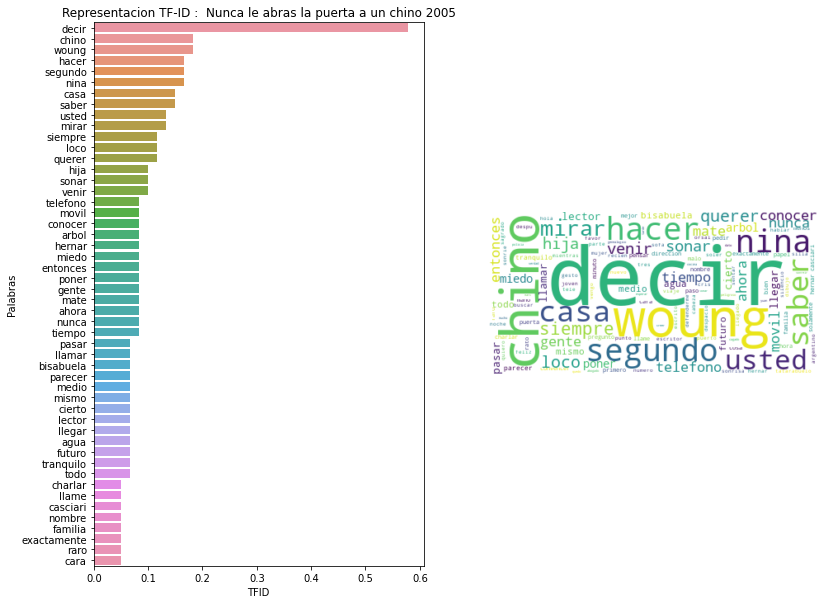

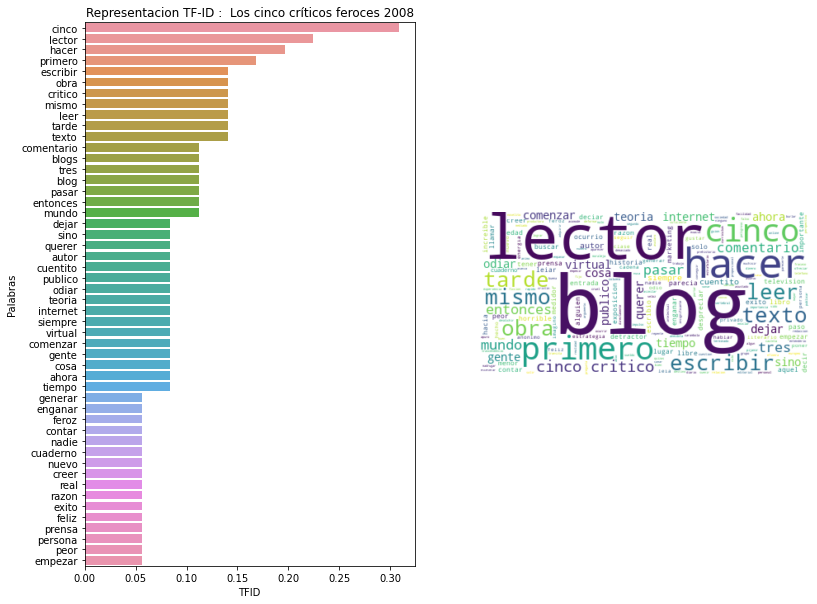

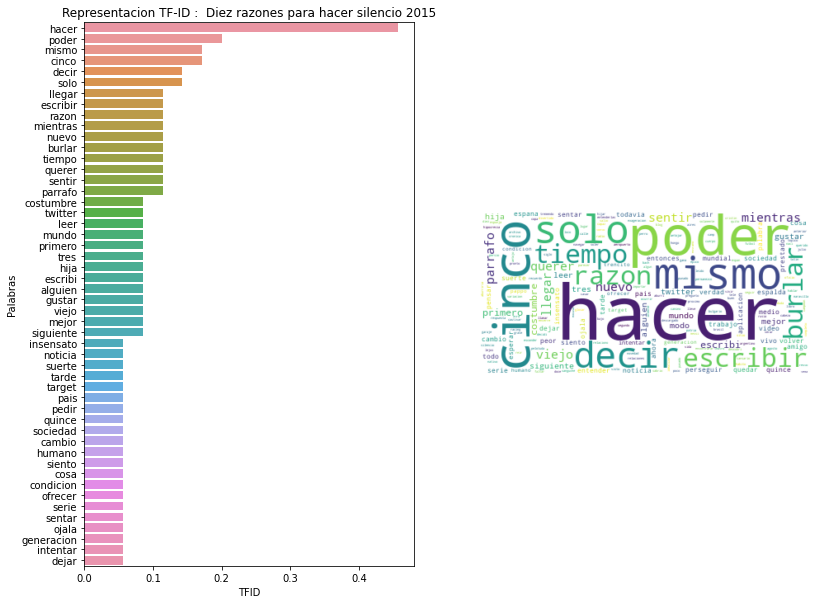

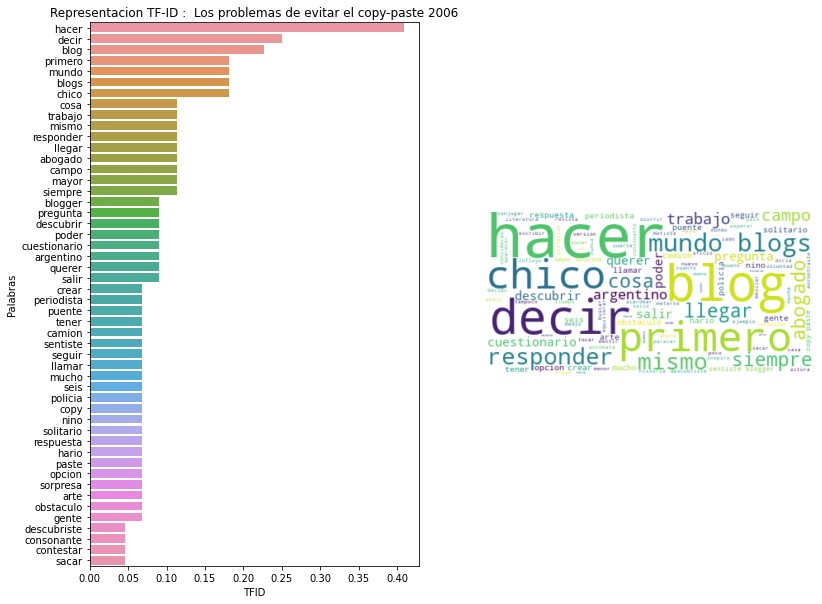

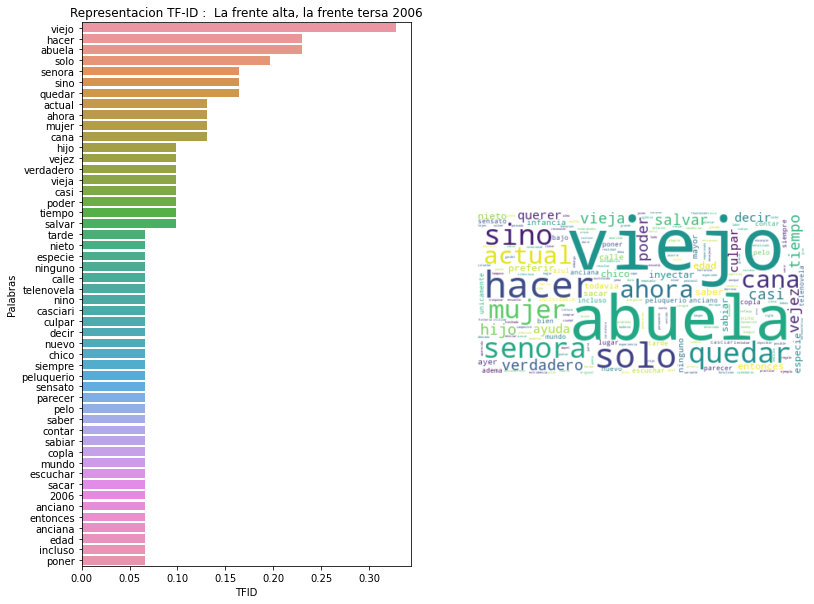

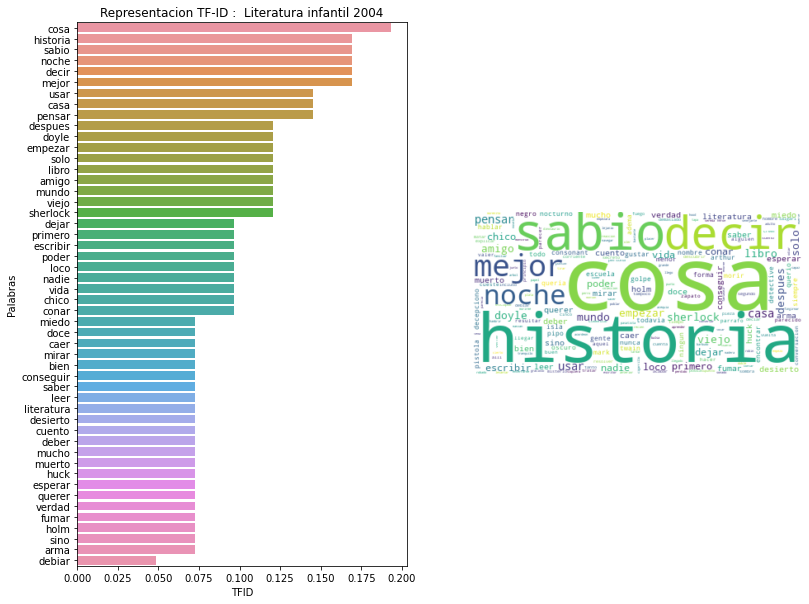

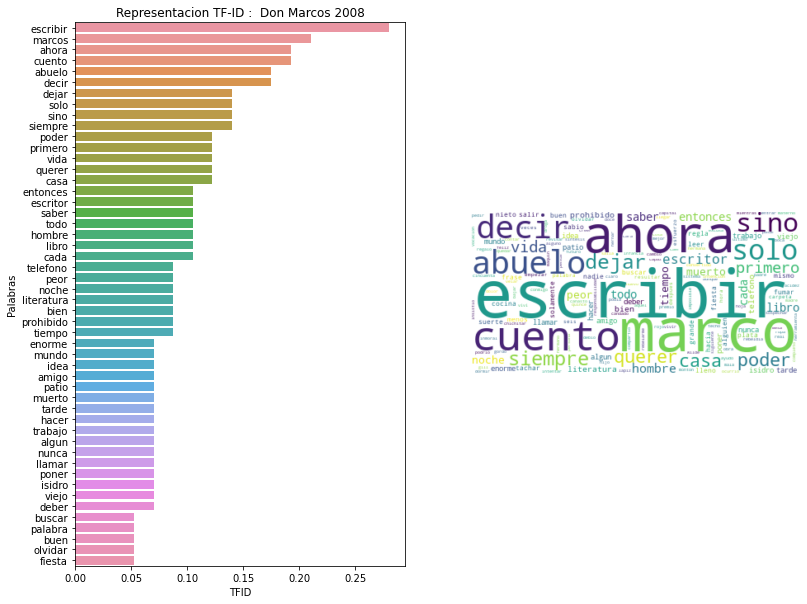

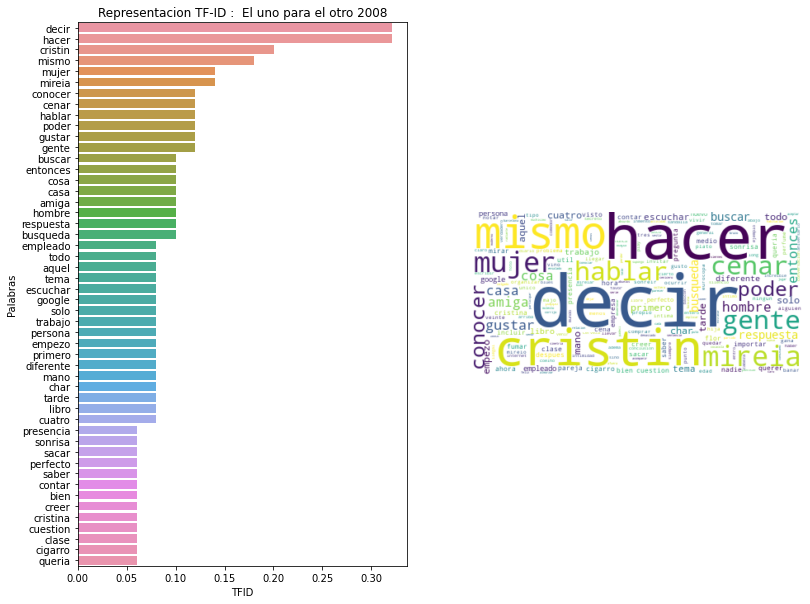

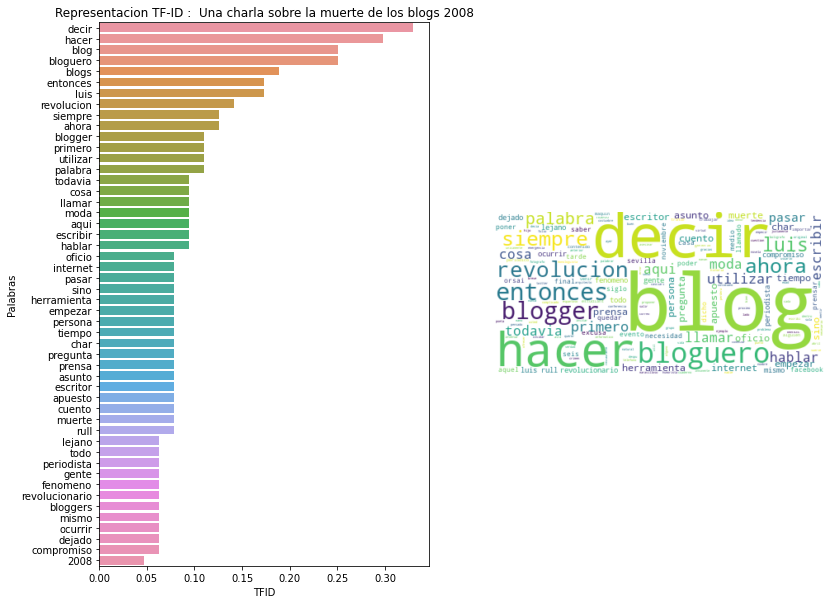

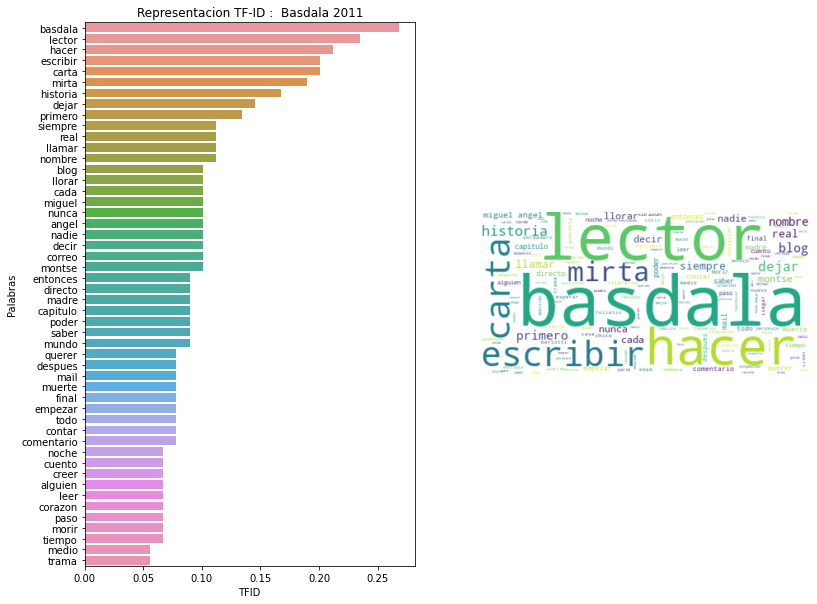

54     471
116    421
165    411
72     454
57     366
1      541
100    690
108    561
121    605
131    920
dtype: int64

In [ ]:
# Funcion de asignacion de topicos dependiendo del corpus
def asignar_topicos(lda, corpus):
  topicos=[]
  for bow in corpus:
    # Se obtiene las probabilidades de los topicos de esta entrada en el corpus 
    prob_topicos=lda.get_document_topics(bow)
    #Se obtiene la mas alta probabilidad y se asigna a ese topico
    topic_mayor_prob= sorted(prob_topicos,key = lambda x: x[1],reverse=True)[0][0]
    topicos.append(topic_mayor_prob)
  return topicos

#MAIN

df=blog.copy()
df.reset_index(inplace=True)
#Asignar topicos 
topicos=asignar_topicos(lda,  corpus)
df['topico'] = topicos

# Usar el recomendador con TFIDVectorizer
tfidf = TfidfVectorizer(analyzer='word')
tfidf_matrix = tfidf.fit_transform(df['texto_preprocesado'])
matrix_similaridades = linear_kernel(tfidf_matrix, tfidf_matrix)

#Se obtiene el topico del tiutlo de referencia
titulo = "Mis conflictos con la ciencia"
topico_titulo= df[df['titulo']==titulo]['topico'].values[0]
# Obtener las recomendaciones 
x= recomendador(titulo,df, matrix_similaridades,100)
# Se escoge las recomendaciones con el mismo topico
x=x[x['topico']==topico_titulo].head(min(10,x.shape[0]))
print('POST A RECOMENDAR:\n')
print(x['titulo'])
# Frecuecia de uso de plabras y nube de palabras de las recomendaciones
print('\nCARACTERIZACION DE LOS TITULOS  A RECOMENDAR:\n')
x.apply(caracterizacion_post,axis=1)


# Análisis
-  Se implementa una funcion de asignacion de topicos que basicamente emplea `ldaModel.get_document_topics(bow)` el cual retorna la probabilidad de los topicos de ese Bag of Words que corresponde a ese cuento. Se asigna el topico con mayor probabilidad. 

- A cada cuento se le asigna un topico con la funcion previamente creada.

- Se obtiene el topico del titulo "Mis conflictos con la ciencia"
- Se usa TfIDVectorizer para obtener la matriz de tf-id  y luego se calcula la matriz de similaridad

- Se obtienen las recomendaciones seleccionando  las de mayor similaridad pero del mismo topico de "Mis conflictos con la ciencia".  

- Una vez se obtiene las 10 recomendaciones  del titulo "Mis conflictos con la ciencia"; se hace una caracterizacion de cada recomendacion con base en el diagrama de tf-id y se obtiene :






| Titulo    | Longitud vocabulario|
| ----------- | ----------- |
|Nunca le abras la puerta a un chino   | 471       |
|Los cinco críticos feroces    |   421     |
|Diez razones para hacer silencio    |    411    |
|Los problemas de evitar el copy-paste |   454      |
|La frente alta, la frente tersa   |    366    |
|Literatura infantil   |     690   |
|Don Marcos |    561  |
|El uno para el otro  |    605    |
|Una charla sobre la muerte de los blogs  |      920  |
|Basdala |  379      |

### Diferencias con metodos anteriores

Haciendo una exploracion del texto de cada una de las recomendaciones , estas recomendaciones estan mas afines al titulo en cuestion: "Mis conflictos con la ciencia". Ademas, aqui se emplea TfidVectorizer mas el modelamieno de topicos que permite dar mayour robustez a la seleccion de recomendaciones





Refine el número de tópicos usando la medida de coherencia. Explique brevemente en que consiste y cuántos tópicos encontró.

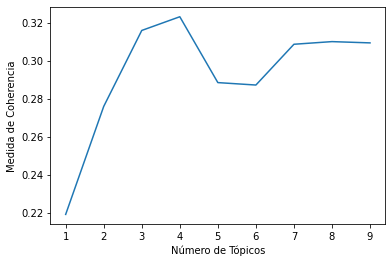

In [ ]:

from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

def calcular_coherencia(diccionario, corpus, textos_tokenizados, start=1, limit=10, step=1):
 
    coherence_values = []
    model_list = []
    
    # Obtener la medida de coherencia por numero de topicos 
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,
                        id2word=diccionario,
                        num_topics=num_topics, 
                        random_state=123,
                        passes=20)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=textos_tokenizados, dictionary=diccionario, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


# MAIN

modelos, valores_c = calcular_coherencia(diccionario=diccionario, 
                                         corpus=corpus, 
                                         textos_tokenizados=sentencias_tokenizadas, 
                                         start=1, limit=10, step=1)

# Mostrar plot de Numero Topicos vs Medida de coherencia
limit=10; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, valores_c)
plt.xlabel("Número de Tópicos")
plt.ylabel("Medida de Coherencia")
plt.show()

# Analisis

- Los documentos o enunciados son coherentes, si se apoyan entre sí y cuan interpretables son los topicos a humanos. 
- Obtenemos la medida de coherencia por numero de topicos usando `gensim.models.coherencemodel.CoherenceModel`.
La medida de coherencia sugiere que hay 4 tipos de tópicos en estos titulos. 

Asigne cada entrada a estos nuevos tópicos y genere recomendaciones restringidas al tópico al que pertenece la entrada que eligió.  Compare con los resultados encontrados anteriormente y explique sus similitudes y/o diferencias.

In [ ]:
# PRIMERA PARTE: VISUALIZAICON TOPICOS CON NUM_TOPICOS=4
lda= modelamiento_topicos(corpus,diccionario,4)

# Visualizacion Topicos
pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(lda, corpus, diccionario)
LDA_visualization



[(0,
  '0.025*"chiri" + 0.008*"gordo" + 0.008*"sueno" + 0.007*"foto" + '
  '0.006*"chico" + 0.006*"padre" + 0.005*"escribir" + 0.005*"hija" + '
  '0.005*"unico" + 0.005*"paso"'),
 (1,
  '0.008*"escribir" + 0.007*"hombre" + 0.007*"historia" + 0.006*"palabra" + '
  '0.006*"lector" + 0.006*"argentino" + 0.005*"parecer" + 0.005*"blog" + '
  '0.005*"pueblo" + 0.005*"venir"'),
 (2,
  '0.022*"argentino" + 0.015*"mundial" + 0.011*"pais" + 0.010*"partido" + '
  '0.010*"futbol" + 0.007*"hombre" + 0.007*"hijo" + 0.007*"padre" + '
  '0.006*"final" + 0.006*"jugar"'),
 (3,
  '0.008*"libro" + 0.008*"padre" + 0.008*"madre" + 0.007*"chico" + '
  '0.006*"hijo" + 0.006*"hombre" + 0.005*"foto" + 0.005*"hacia" + '
  '0.005*"escribir" + 0.005*"llorar"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.015358  0.007219       1        1  35.488340
1     -0.003004 -0.031324       2        1  27.398815
0      0.022798  0.011085       3        1  19.174429
2     -0.035153  0.013020       4        1  17.938417, topic_info=          Term        Freq       Total Category  logprob  loglift
574      chiri  219.000000  219.000000  Default  30.0000  30.0000
3    argentino  283.000000  283.000000  Default  29.0000  29.0000
588    mundial  126.000000  126.000000  Default  28.0000  28.0000
480    partido  102.000000  102.000000  Default  27.0000  27.0000
474     futbol  125.000000  125.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
168     llevar   30.636247  160.863158   Topic4  -5.4530   0.0599
30      grande   30.111501  156.539441   Topic4  -5.4703   0.0698
243      calle   27.242121  117.123349   Topic4  -5.5704   0.2598
8        cinco   29.038436  162.182373   Topic4  -5.5066  -0.0019
312      venir   26.605185  173.699323   Topic4  -5.5941  -0.1580

[277 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
664       1  0.374365    2007
664       2  0.187183    2007
664       3  0.093591    2007
664       4  0.374365    2007
666       1  0.120181    2014
...     ...       ...     ...
281       4  0.235818   vivir
313       1  0.342889  volver
313       2  0.209932  volver
313       3  0.209932  volver
313       4  0.237923  volver

[796 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 1, 3])

# Analisis

- Esta vez en el topico 1 y 3 hay una superposicion y el diamero de estos dos circulos no estan grandes y lo cual permite concluir qe hay diversidad de temas que no puede distinguir correctamente el modelo.

POST A RECOMENDAR:

54         Nunca le abras la puerta a un chino
116                 Los cinco críticos feroces
165           Diez razones para hacer silencio
72       Los problemas de evitar el copy-paste
64                   Y que mi padre me perdone
108                        El uno para el otro
121    Una charla sobre la muerte de los blogs
131                                    Basdala
128                                   Renuncio
77                     Justificar los márgenes
Name: titulo, dtype: object

CARACTERIZACION DE LOS TITULOS  A RECOMENDAR:



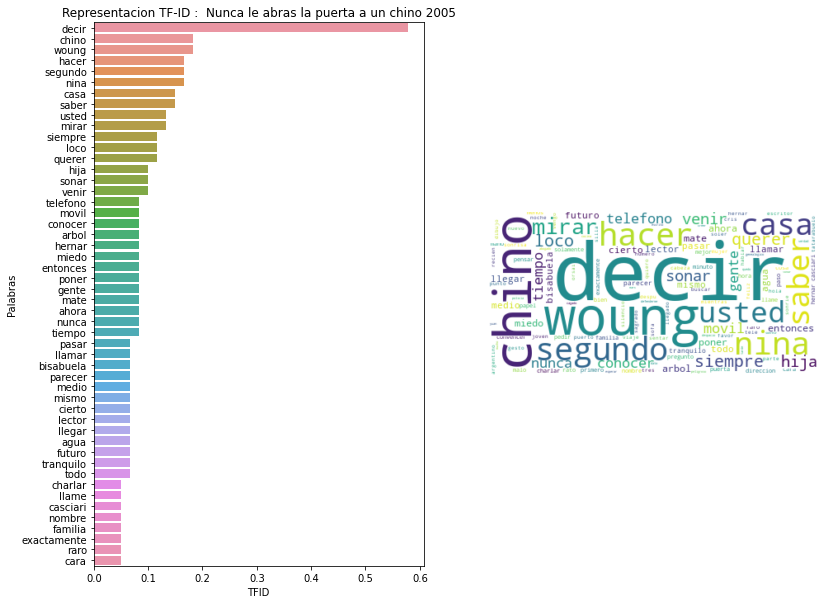

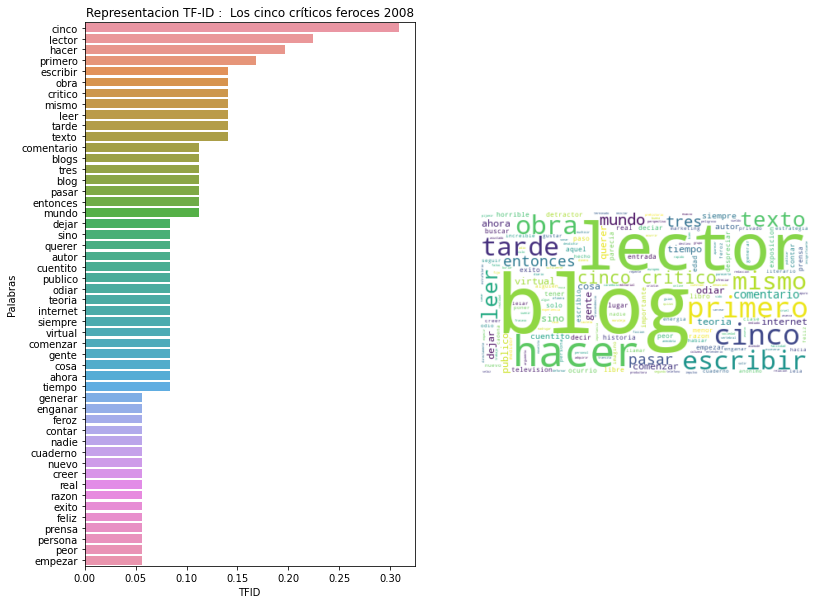

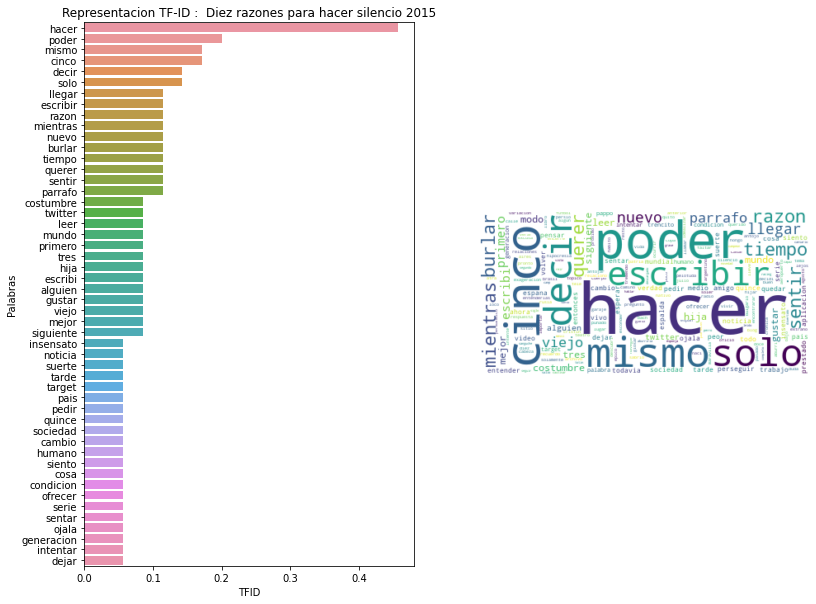

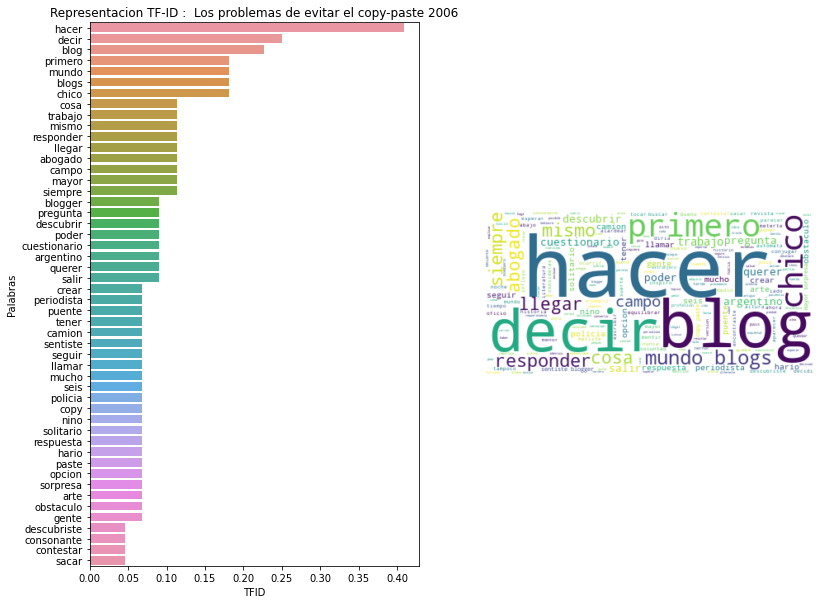

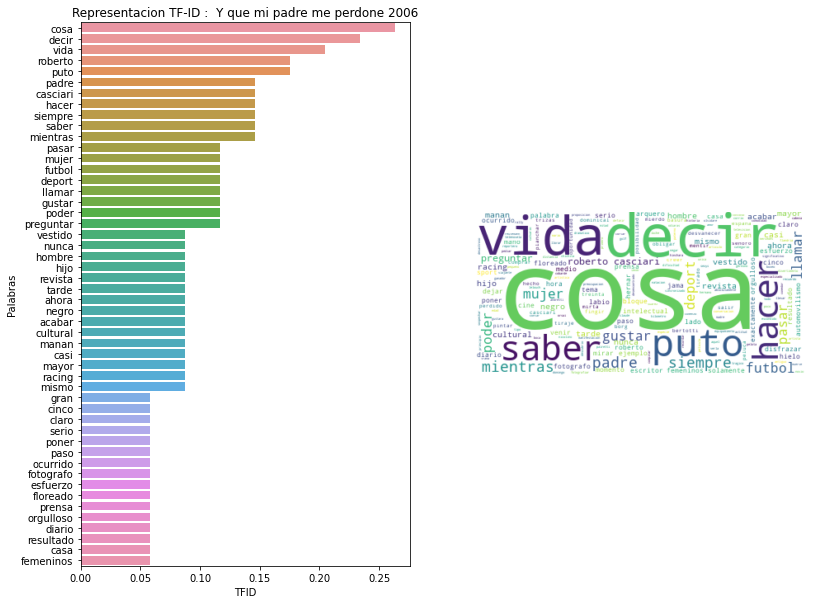

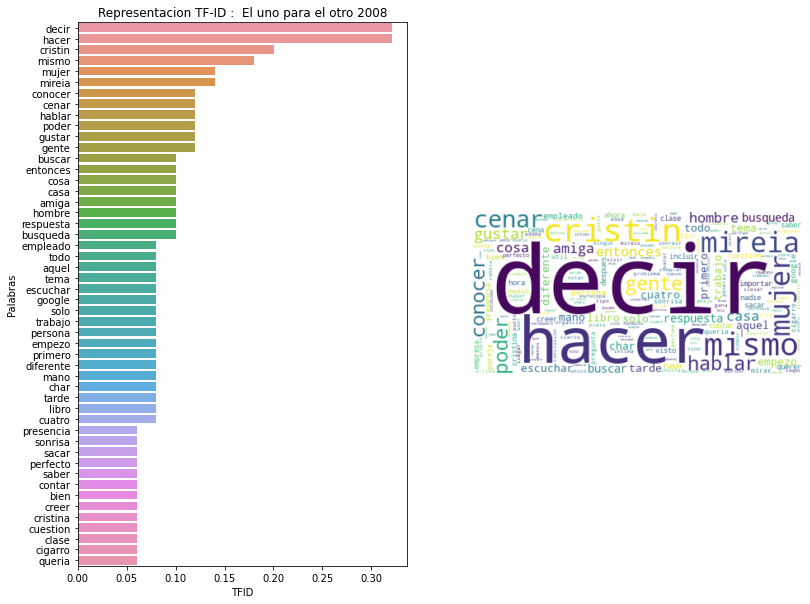

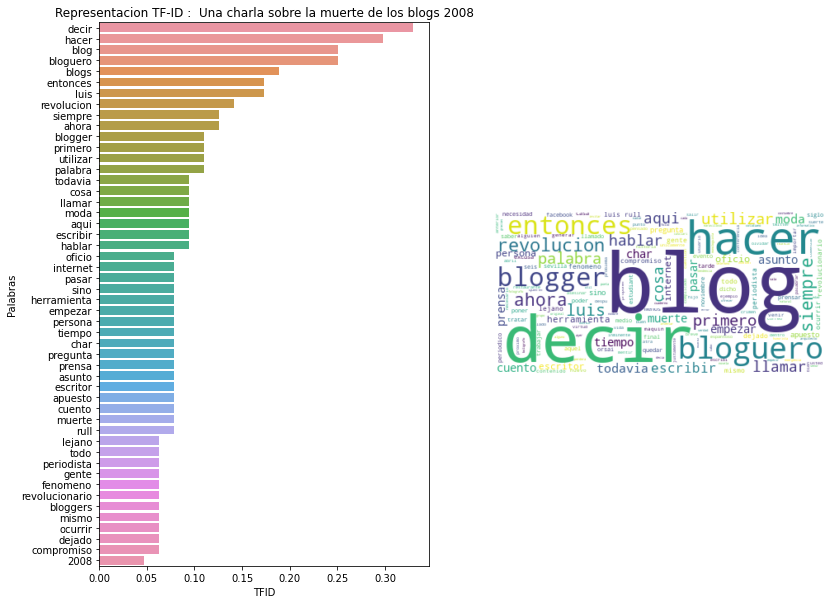

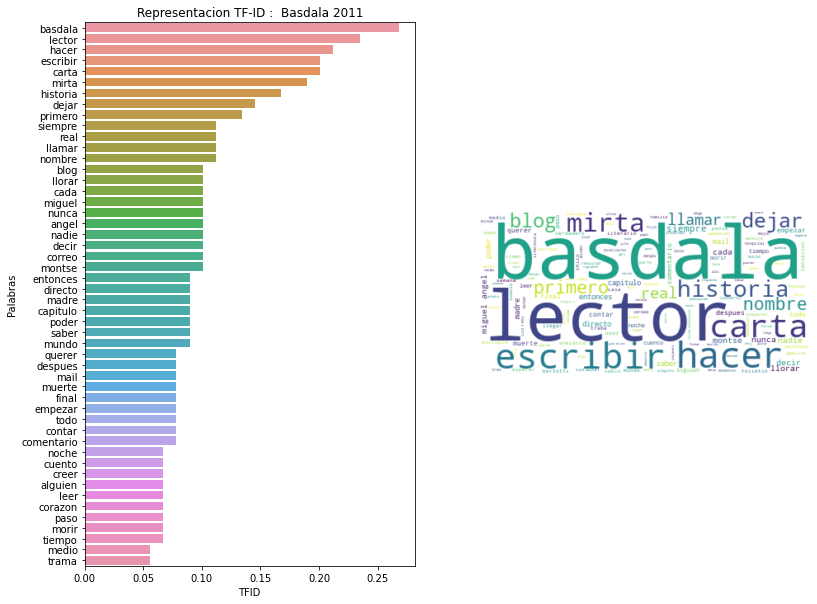

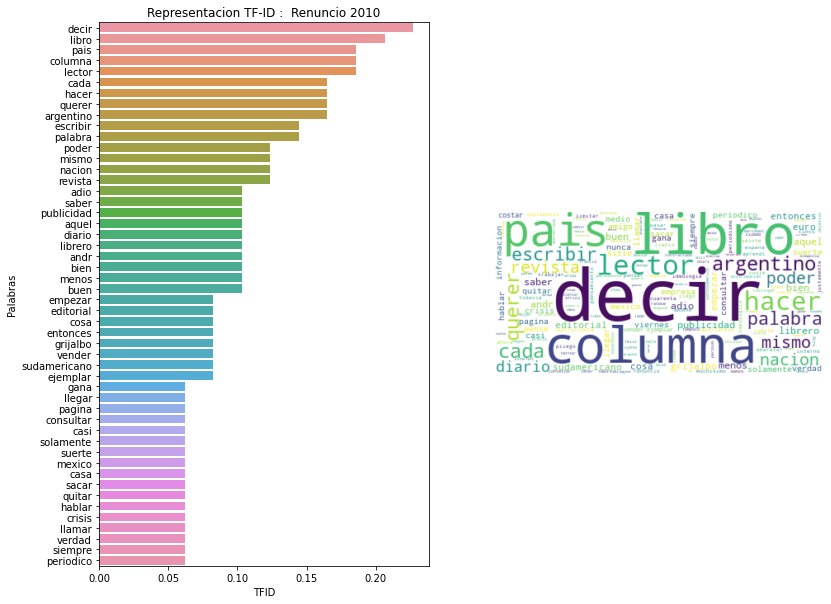

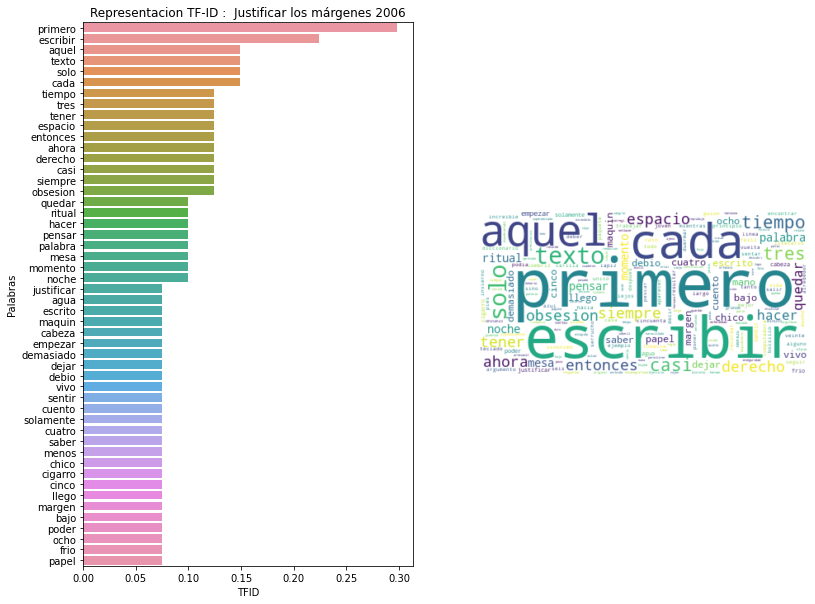

54     471
116    421
165    411
72     454
64     407
108    561
121    605
131    920
128    558
77     502
dtype: int64

In [ ]:
#SEGUNDA PARTE: ASIGNACION DE NUEVOS TOPICOS y GENERAR RECOMENDACIONES 
df=blog.copy()
df.reset_index(inplace=True)
topicos=asignar_topicos(lda,  corpus)
df['topico'] = topicos
x= recomendador(titulo,df, matrix_similaridades,100)
x=x[x['topico']==topico_titulo].head(min(10,x.shape[0]))
print('POST A RECOMENDAR:\n')
print(x['titulo'])
# Frecuecia de uso de plabras y nube de palabras de las recomendaciones
print('\nCARACTERIZACION DE LOS TITULOS  A RECOMENDAR:\n')
x
x.apply(caracterizacion_post,axis=1)


# Análisis
-  Se implementa una funcion de asignacion de topicos que basicamente emplea `ldaModel.get_document_topics(bow)` el cual retorna la probabilidad de los topicos de ese Bag of Words que corresponde a ese cuento. Se asigna el topico con mayor probabilidad. 

- A cada cuento se le asigna un topico con la funcion previamente creada.

- Se obtiene el topico del titulo "Mis conflictos con la ciencia"
- Se usa TfIDVectorizer para obtener la matriz de tf-id  y luego se calcula la matriz de similaridad

- Se obtienen las recomendaciones seleccionando  las de mayor similaridad pero del mismo topico de "Mis conflictos con la ciencia".  

- Una vez se obtiene las 10 recomendaciones  del titulo "Mis conflictos con la ciencia"; se hace una caracterizacion de cada recomendacion con base en el diagrama de tf-id y se obtiene :


| Titulo    | Longitud vocabulario|
| ----------- | ----------- |
|Nunca le abras la puerta a un chino   | 471       |
|Los cinco críticos feroces    | 421       |
|Diez razones para hacer silencio    | 411       |
|Los problemas de evitar el copy-paste    | 454       |
|Y que mi padre me perdone  | 407       |
|El uno para el otro  | 561       |
|  Una charla sobre la muerte de los blogs    | 605       |
|Basdala   | 920       |
|Renuncio |558      |
|Justificar los márgenes  | 502       |

### 4. Recomendaciones generales

# Analisis

-El procedimiento que genero mejores entradas fue modelamiento por topicos porque incluye la TFIdvectorizacion  y la robutez del sistema de coherencia por topicos.

### Conclusiones
Ventajas de los sistemas de recomendacion basada en contenidos;

- No depende los datos de otros usuarios.
- No hay el problema de 'arranque frio' cuado apaece un nuevo item/titulo. Ya con el hecho de tener los features de ese item o titulo es suficiente.

- Resultados de la recomendacion son interpretables.

### Evaluacion
- Toda evaluacion necesita una linea base , y esa linea base es el rating que manifiesta la preferencia del usuario. Si un usuario ha calificado positivamente a un item, entonces el sistema aprendera recomendar item con esas mismas caracteriticas, y el metodo de evaluacion seria:

- Particionamos  la matrix de ultidad (m usuarios x n items) en XTrain y XTest- El recomendador se construye sobre XTrain.
- Para la evaluacion, por cada usuario en XTest, seleccionamos los items que ese usuario califico o interactuo positivamente
- De esas inteacciones positivas se contrasta con las recomendaciones para ver si estos items estan incluidos en las recomendaciones.
- Usando alguna metrica de clasificacion como Recall o F1, se podria evaluar el algoritmo de clasificacion.